In [1]:
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [2]:
from scipy.spatial.transform import Rotation

In [3]:
def positional_encoding(x, num_frequencies=6, incl_input=True):

    results = []
    if incl_input:
        results.append(x)
  
    freq = torch.pow(2,torch.arange(num_frequencies)).to(device)
    sin_list = torch.sin(torch.pi*freq*x.reshape((-1,1))).to(device)
    cos_list  = torch.cos(torch.pi*freq*x.reshape((-1,1))).to(device)
    results.append(sin_list.reshape((x.shape[0],-1)))
    results.append(cos_list.reshape((x.shape[0],-1)))
    return torch.cat(results, dim=-1)


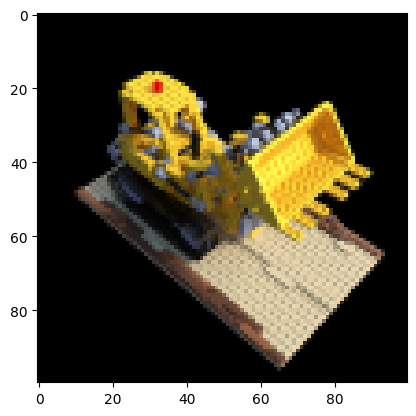

In [4]:

data = np.load("lego_data.npz")


images = data["images"]


height, width = images.shape[1:3]


poses = data["poses"]
poses = torch.from_numpy(poses).to(device)


intrinsics = data["intrinsics"]
intrinsics = torch.from_numpy(intrinsics).to(device)


test_image, test_pose = images[101], poses[101]
test_image = torch.from_numpy(test_image).to(device)


images = torch.from_numpy(images[:100, ..., :3]).to(device)

plt.imshow(test_image.detach().cpu().numpy())
plt.show()

In [5]:
def get_rays(height, width, intrinsics, w_R_c, w_T_c):

    device = intrinsics.device
    ray_directions = torch.zeros((height, width, 3), device=device)  
    ray_origins = torch.zeros((height, width, 3), device=device)  


    coords = torch.stack(torch.meshgrid(torch.arange(height), torch.arange(width), indexing='xy'), -1).reshape((-1,2))
    coords = torch.concat((coords, torch.ones(coords.shape[0],1)), -1).to(device)
    
    rays = w_R_c @ torch.linalg.inv(intrinsics) @ coords.T
    
    
    rays = rays/torch.norm(rays, dim=0)
    rays_directions = rays.T.reshape((height,width,3))
    rays_origins = torch.broadcast_to(w_T_c.T, ((height, width,3)))
    
    

    return rays_origins, rays_directions

In [6]:
def stratified_sampling(ray_origins, ray_directions, near, far, samples):


    i = torch.arange(samples)
    depth = near + (i/samples)*(far-near)
    depth = depth.to(device)
    ray_points = torch.unsqueeze(ray_origins, dim=3) + torch.unsqueeze(ray_directions, dim = 3) * depth
    ray_points = ray_points.permute(0,1,3,2)
    depth_points = torch.broadcast_to(depth, (ray_origins.shape[0], ray_origins.shape[1], samples))

    return ray_points, depth_points

In [7]:
class nerf_model(nn.Module):

 

    def __init__(self, filter_size=256, num_x_frequencies=6, num_d_frequencies=3):
        super().__init__()

 
        self.layers = nn.ModuleDict({
            'layer_1': nn.Linear(3*2*num_x_frequencies + 3, filter_size),
            'layer_2': nn.Linear(filter_size,filter_size),
            'layer_3': nn.Linear(filter_size,filter_size),
            'layer_4': nn.Linear(filter_size,filter_size),
            'layer_5': nn.Linear(filter_size,filter_size),
            'layer_6': nn.Linear(filter_size+3*2*num_x_frequencies + 3, filter_size),
            'layer_7': nn.Linear(filter_size,filter_size),
            'layer_8': nn.Linear(filter_size,filter_size),
            'layer_s': nn.Linear(filter_size,1),
            'layer_9': nn.Linear(filter_size,filter_size),
            'layer_10': nn.Linear(filter_size+3*2*num_d_frequencies + 3,filter_size//2),
            'layer_11': nn.Linear(filter_size//2, 3),
        })




    def forward(self, x, d):

        
        out = self.layers['layer_1'](x)
        out = F.relu(out)
        out = self.layers['layer_2'](out)
        out = F.relu(out)
        out = self.layers['layer_3'](out)
        out = F.relu(out)
        out = self.layers['layer_4'](out)
        out = F.relu(out)
        out = self.layers['layer_5'](out)
        out = F.relu(out)
        out = torch.concat([x,out], -1)
        out = self.layers['layer_6'](out)
        out = F.relu(out)
        out = self.layers['layer_7'](out)
        out = F.relu(out)
        out = self.layers['layer_8'](out)
        sigma = self.layers['layer_s'](out)
        sigma = F.relu(sigma)
        out = self.layers['layer_9'](out)
        out = F.relu(out)
        out = torch.concat([out, d], -1)
        out = self.layers['layer_10'](out)
        out = F.relu(out)
        out = self.layers['layer_11'](out)
        rgb = F.sigmoid(out)

        return rgb, sigma

In [8]:
def get_batches(ray_points, ray_directions, num_x_frequencies, num_d_frequencies):

    def get_chunks(inputs, chunksize = 2**15):
       
        return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

   

    ray_directions = torch.unsqueeze(ray_directions, dim=2)
    ray_directions = torch.broadcast_to(ray_directions, ray_points.shape)
    
    
    embed_ray_dir = positional_encoding(ray_directions.reshape((-1,3)), num_frequencies=num_d_frequencies, incl_input=True)
    embed_ray_point = positional_encoding(ray_points.reshape((-1,3)), num_frequencies=num_x_frequencies, incl_input=True)
    ray_points_batches = get_chunks(embed_ray_point)
    ray_directions_batches = get_chunks(embed_ray_dir)
    
    
    
    


    return ray_points_batches, ray_directions_batches

In [9]:
def volumetric_rendering(rgb, s, depth_points):

    delta = depth_points[...,1:]  - depth_points[...,:-1]
    delta = torch.concat([delta, torch.ones((delta.shape[0], delta.shape[1], 1)).to(device)*1e9], -1) 
    inter_Ti = torch.exp(-s*delta)
    Ti = torch.concat([torch.ones((delta.shape[0], delta.shape[1], 1)).to(device),torch.cumprod(inter_Ti, dim=-1)[:,:,:-1]], -1)

    c = torch.unsqueeze(Ti, dim=-1) * (1-torch.unsqueeze(inter_Ti, dim=-1)) * rgb
    rec_image = torch.sum(c, dim=2)



    return rec_image

In [71]:
def one_forward_pass(height, width, intrinsics, w_R_c, w_T_c, near, far, samples, model, num_x_frequencies, num_d_frequencies):



    

    
    
    
    
    ray_o, ray_d = get_rays(height, width, intrinsics, w_R_c.reshape((3,3)), w_T_c.reshape((3,1)))

    
    ray_points, depth_points = stratified_sampling(ray_o, ray_d, near, far, samples)

    
    ray_points_batches, ray_directions_batches = get_batches(ray_points, ray_d, num_x_frequencies, num_d_frequencies)
    rgb_list = []
    sigma_list =[]
    
    for batch_i in range(len(ray_points_batches)):
      
      rgb, sigma = model(ray_points_batches[batch_i], ray_directions_batches[batch_i])
      rgb_list.append(rgb)
      sigma_list.append(sigma)
      
    rec_image = volumetric_rendering(torch.concat(rgb_list, 0).reshape((height, width,samples, 3)), torch.concat(sigma_list,0).reshape((height, width, samples)), depth_points)


    return rec_image

In [72]:
num_x_frequencies = 10
num_d_frequencies = 4
learning_rate  = 5e-4
iterations = 3000
samples = 64
display = 25
near = 0.667
far = 2

model = nerf_model(num_x_frequencies=num_x_frequencies,num_d_frequencies=num_d_frequencies).to(device)

def weights_init(m):
    if isinstance(m, torch.nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
model.apply(weights_init)

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

psnrs = []
iternums = []

t = time.time()
t0 = time.time()

In [73]:
criterion = torch.nn.MSELoss()

In [74]:
poses = torch.Tensor(poses)
poses.shape

torch.Size([106, 4, 4])

In [75]:
w_T_c_all = poses[:,:3,-1]
w_T_c_all.shape

torch.Size([106, 3])

In [76]:
w_R_c_all = poses[:,:3,:3]
w_R_c_all.shape

torch.Size([106, 3, 3])

In [77]:
r = Rotation.from_matrix(w_R_c_all.cpu())
euler_angles_all_orig = torch.Tensor(r.as_euler('xyz', degrees = False))
euler_angles_all_orig.shape

torch.Size([106, 3])

In [78]:
euler_angles_all_orig[0,...]

tensor([-1.8752e+00, -5.8094e-10, -3.1276e+00])

In [79]:

noise = torch.randn_like(euler_angles_all_orig)
euler_angles_all = euler_angles_all_orig + 0.1*noise
euler_angles_all.shape, euler_angles_all[0,...]

(torch.Size([106, 3]), tensor([-1.7834,  0.0065, -3.2438]))

In [80]:
r =  Rotation.from_euler('xyz', euler_angles_all, degrees=False)
w_R_c_all_perturb = torch.from_numpy(r.as_matrix()).float().to(device)



w_R_c_all_perturb[0].shape, w_R_c_all_perturb[0]

(torch.Size([3, 3]),
 tensor([[-0.9948,  0.0278, -0.0984],
         [ 0.1020,  0.2093, -0.9725],
         [-0.0065, -0.9775, -0.2110]], device='cuda:0'))

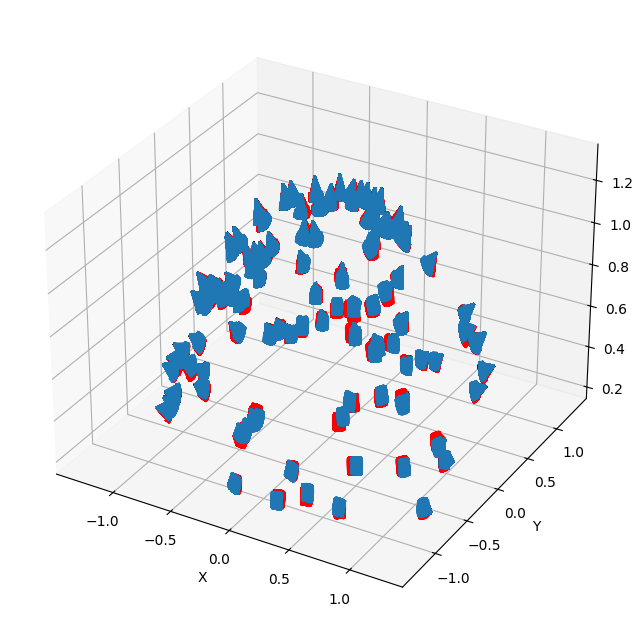

In [21]:
def plot_all_poses(poses, w_R_c_all_perturb, w_T_c_all):


    poses = torch.Tensor(poses).to(device)
    
    w_R_c = poses[:,:3,:3]
    w_T_c = poses[:,:3,3]
    origins = torch.zeros((poses.shape[0],height, width, 3))
    directions = torch.zeros((poses.shape[0],height, width, 3))
    for i in range(poses.shape[0]):
      ray_o, ray_d = get_rays(height, width, intrinsics, w_R_c[i,...].reshape((3,3)), w_T_c[i,...].reshape((3,1)))
      origins[i] = ray_o.to('cpu')
      directions[i] = ray_d.to('cpu')
      
      
    


    ax = plt.figure(figsize=(12, 8)).add_subplot(projection='3d')
    _ = ax.quiver(origins[..., 0].flatten(),
                  origins[..., 1].flatten(),
                  origins[..., 2].flatten(),
                  directions[..., 0].flatten(),
                  directions[..., 1].flatten(),
                  directions[..., 2].flatten(), length=0.12, normalize=True, color='red')
    
    w_R_c = w_R_c_all_perturb
    w_T_c = w_T_c_all
    origins = torch.zeros((poses.shape[0],height, width, 3))
    directions = torch.zeros((poses.shape[0],height, width, 3))
    for i in range(poses.shape[0]):
      ray_o, ray_d = get_rays(height, width, intrinsics, w_R_c[i,...].reshape((3,3)), w_T_c[i,...].reshape((3,1)))
      origins[i] = ray_o.to('cpu')
      directions[i] = ray_d.to('cpu')
      
      
    


    _ = ax.quiver(origins[..., 0].flatten(),
                  origins[..., 1].flatten(),
                  origins[..., 2].flatten(),
                  directions[..., 0].flatten(),
                  directions[..., 1].flatten(),
                  directions[..., 2].flatten(), length=0.12, normalize=True)
  
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('z')
    plt.show()

plot_all_poses(data['poses'], w_R_c_all_perturb, w_T_c_all)

In [81]:

test_pose_w_R_c = test_pose[:3,:3]
test_pose_w_T_c = test_pose[:3, 3]

In [82]:
mse_euler_error_list = []
loss_list = []
psnr_list = []

In [83]:
lr_rotation = 0.5

In [84]:
running_mse_euler_error = 0
running_loss = 0
running_psnr = 0

Iteration 0  Loss: 0.1668  PSNR: 7.78  Time: 0.91 secs per iter,  0.38 mins in total
The rotation error as compared to GT Rotation : 0.008967510424554348


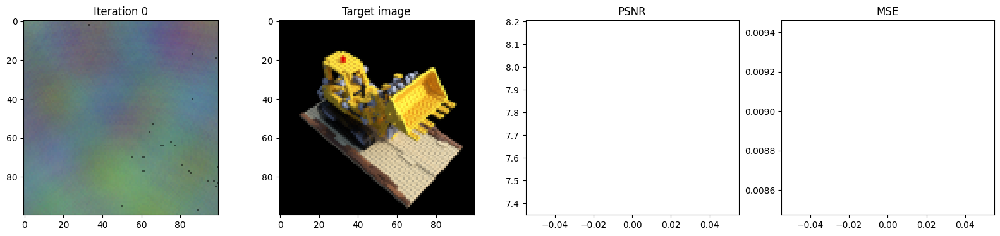

Iteration 25  Loss: 0.0879  PSNR: 10.56  Time: 0.32 secs per iter,  0.51 mins in total
The rotation error as compared to GT Rotation : 0.008958014659583569


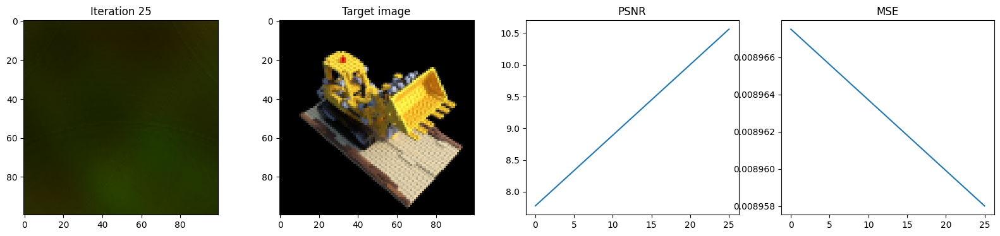

Iteration 50  Loss: 0.0841  PSNR: 10.75  Time: 0.32 secs per iter,  0.65 mins in total
The rotation error as compared to GT Rotation : 0.00894524808973074


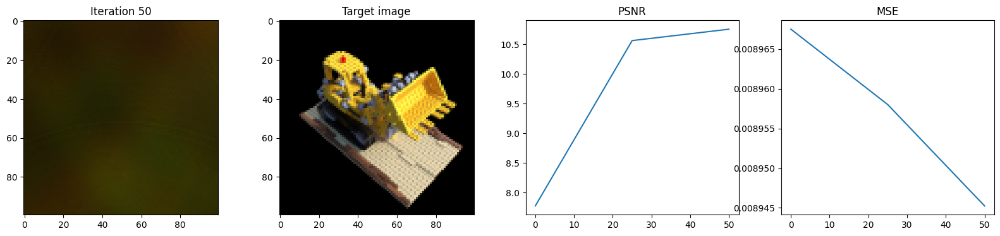

Iteration 75  Loss: 0.0833  PSNR: 10.80  Time: 0.33 secs per iter,  0.79 mins in total
The rotation error as compared to GT Rotation : 0.008891203440725803


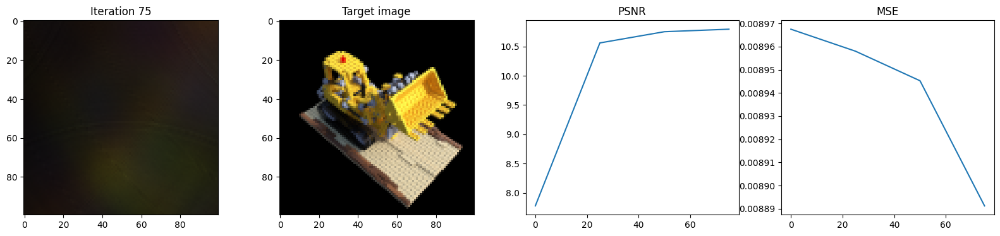

Iteration 100  Loss: 0.0702  PSNR: 11.54  Time: 0.33 secs per iter,  0.92 mins in total
The rotation error as compared to GT Rotation : 0.00865569245070219


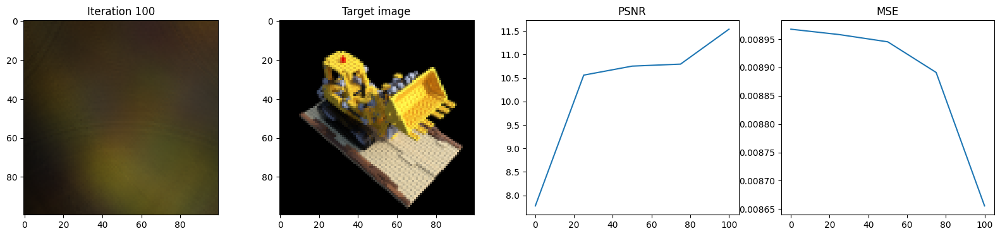

Iteration 125  Loss: 0.0648  PSNR: 11.89  Time: 0.33 secs per iter,  1.06 mins in total
The rotation error as compared to GT Rotation : 0.008155501447618008


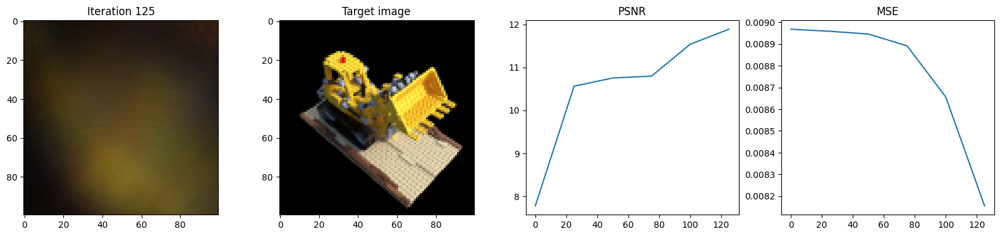

Iteration 150  Loss: 0.0600  PSNR: 12.22  Time: 0.33 secs per iter,  1.19 mins in total
The rotation error as compared to GT Rotation : 0.007735754828900099


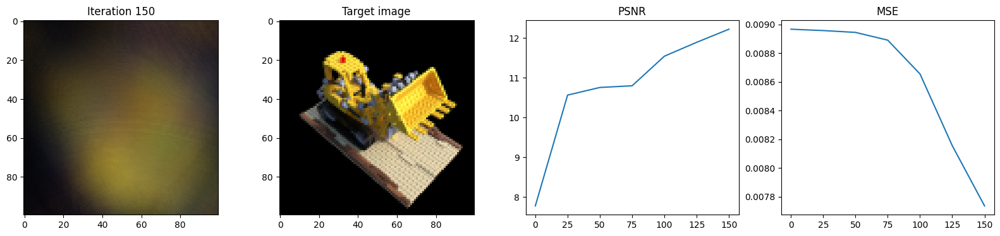

Iteration 175  Loss: 0.0504  PSNR: 12.98  Time: 0.33 secs per iter,  1.33 mins in total
The rotation error as compared to GT Rotation : 0.007383852731436491


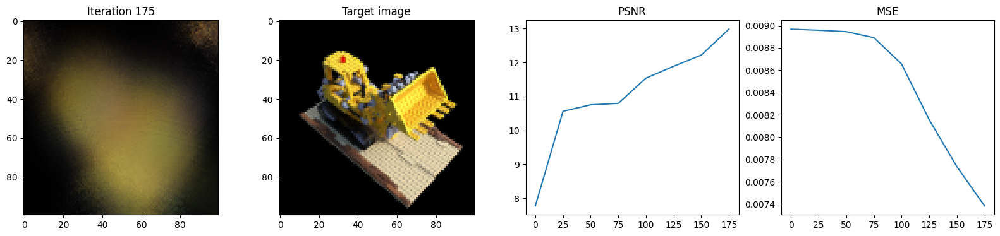

Iteration 200  Loss: 0.0483  PSNR: 13.16  Time: 0.33 secs per iter,  1.47 mins in total
The rotation error as compared to GT Rotation : 0.006839623209089041


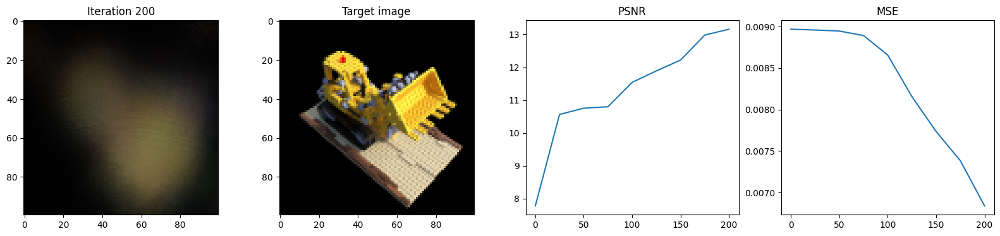

Iteration 225  Loss: 0.0418  PSNR: 13.79  Time: 0.32 secs per iter,  1.60 mins in total
The rotation error as compared to GT Rotation : 0.006610136479139328


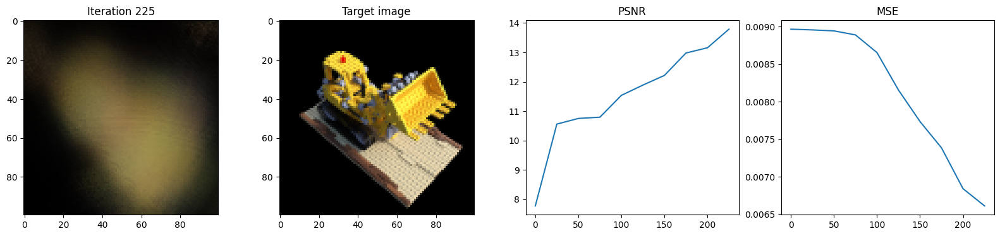

Iteration 250  Loss: 0.0397  PSNR: 14.01  Time: 0.32 secs per iter,  1.74 mins in total
The rotation error as compared to GT Rotation : 0.006663343403488398


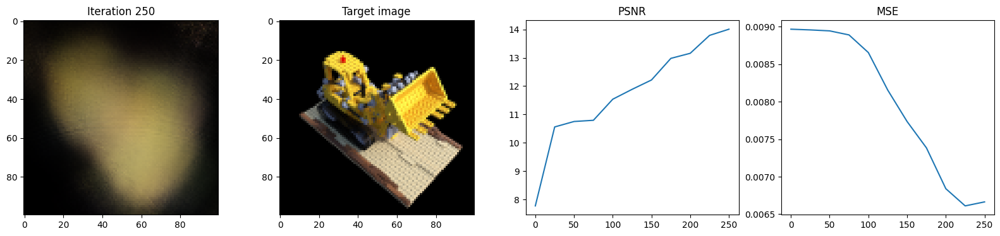

Iteration 275  Loss: 0.0361  PSNR: 14.42  Time: 0.33 secs per iter,  1.87 mins in total
The rotation error as compared to GT Rotation : 0.006542166694998741


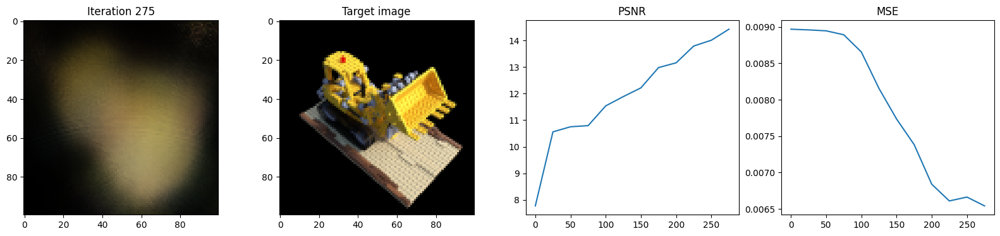

Iteration 300  Loss: 0.0391  PSNR: 14.08  Time: 0.32 secs per iter,  2.01 mins in total
The rotation error as compared to GT Rotation : 0.006415240466594696


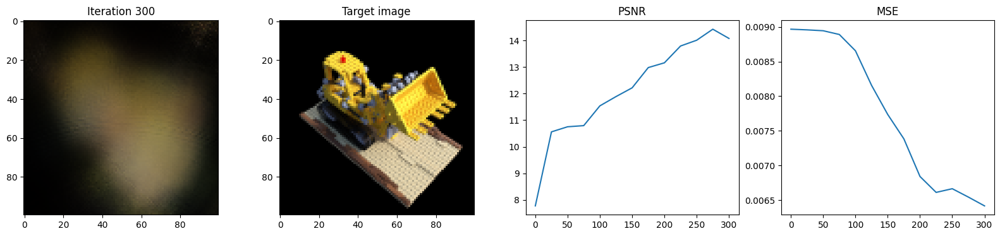

Iteration 325  Loss: 0.0389  PSNR: 14.10  Time: 0.32 secs per iter,  2.14 mins in total
The rotation error as compared to GT Rotation : 0.006315792910754681


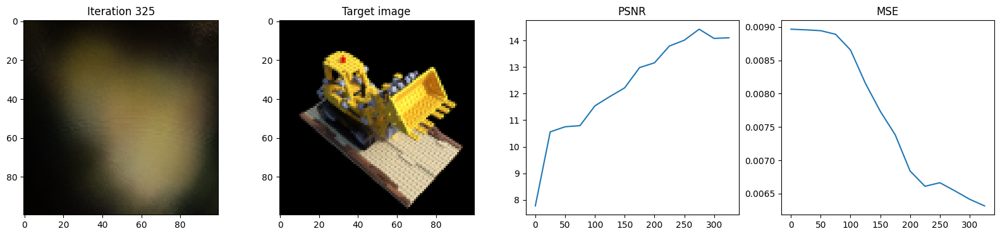

Iteration 350  Loss: 0.0325  PSNR: 14.88  Time: 0.32 secs per iter,  2.28 mins in total
The rotation error as compared to GT Rotation : 0.0062181381508708


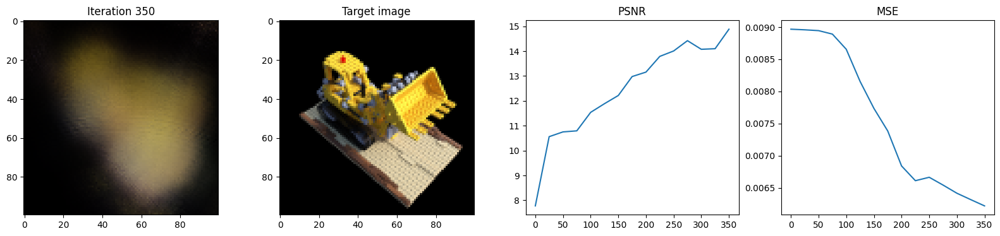

Iteration 375  Loss: 0.0332  PSNR: 14.78  Time: 0.32 secs per iter,  2.41 mins in total
The rotation error as compared to GT Rotation : 0.006122921127825975


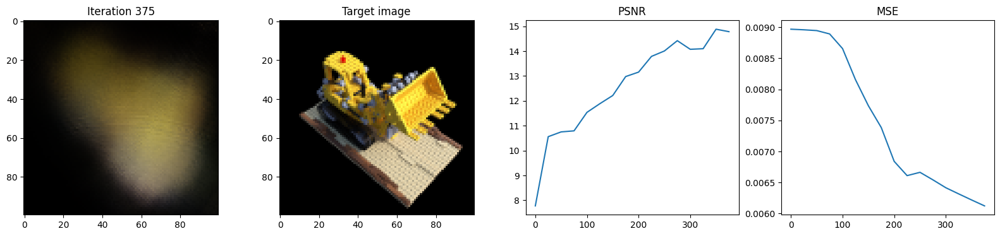

Iteration 400  Loss: 0.0341  PSNR: 14.67  Time: 0.32 secs per iter,  2.55 mins in total
The rotation error as compared to GT Rotation : 0.0060453349724411964


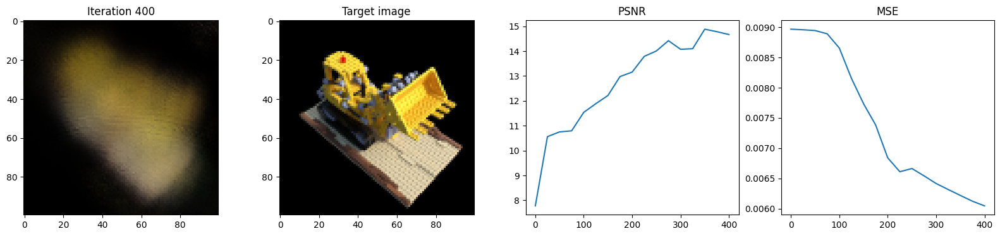

Iteration 425  Loss: 0.0319  PSNR: 14.97  Time: 0.32 secs per iter,  2.68 mins in total
The rotation error as compared to GT Rotation : 0.005960199050605297


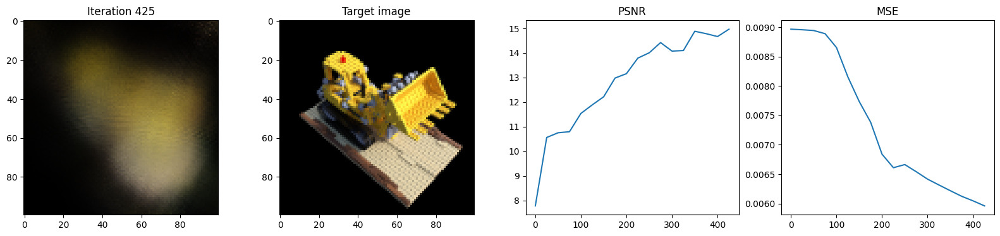

Iteration 450  Loss: 0.0318  PSNR: 14.97  Time: 0.32 secs per iter,  2.82 mins in total
The rotation error as compared to GT Rotation : 0.005895446520298719


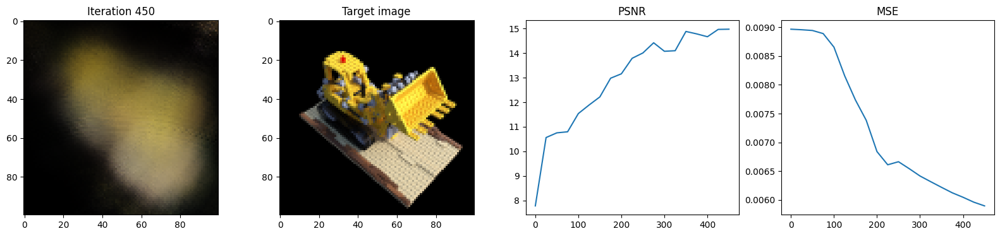

Iteration 475  Loss: 0.0330  PSNR: 14.81  Time: 0.32 secs per iter,  2.95 mins in total
The rotation error as compared to GT Rotation : 0.005799730308353901


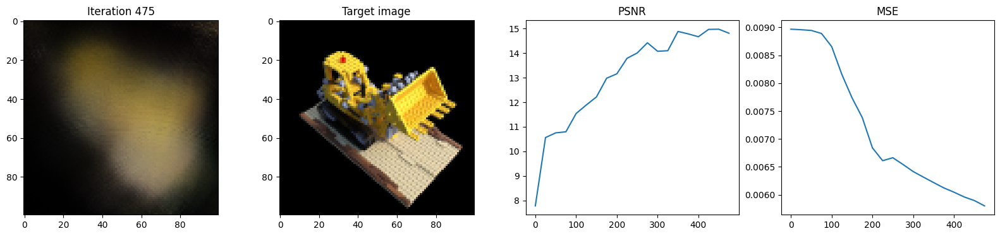

Iteration 500  Loss: 0.0297  PSNR: 15.28  Time: 0.33 secs per iter,  3.09 mins in total
The rotation error as compared to GT Rotation : 0.005698393564671278


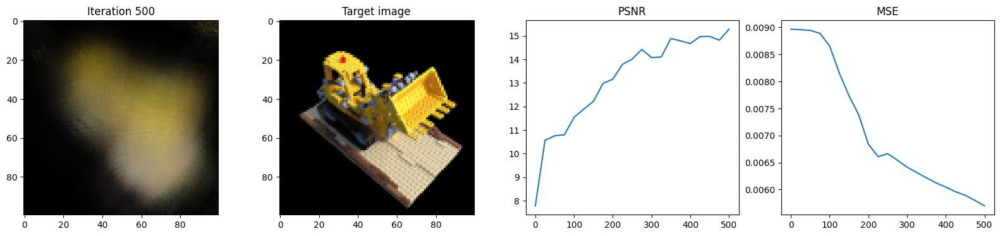

Iteration 525  Loss: 0.0305  PSNR: 15.15  Time: 0.32 secs per iter,  3.22 mins in total
The rotation error as compared to GT Rotation : 0.005690114572644234


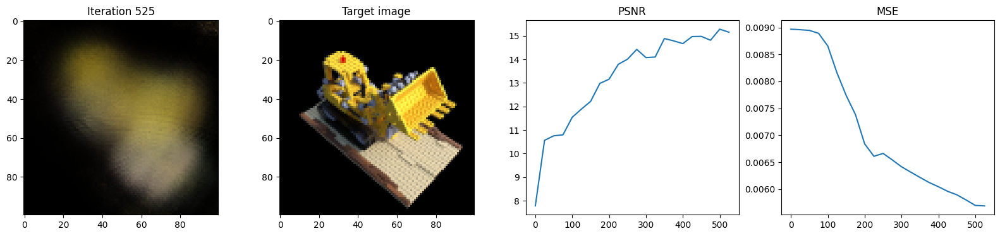

Iteration 550  Loss: 0.0312  PSNR: 15.05  Time: 0.32 secs per iter,  3.36 mins in total
The rotation error as compared to GT Rotation : 0.0056731426157057285


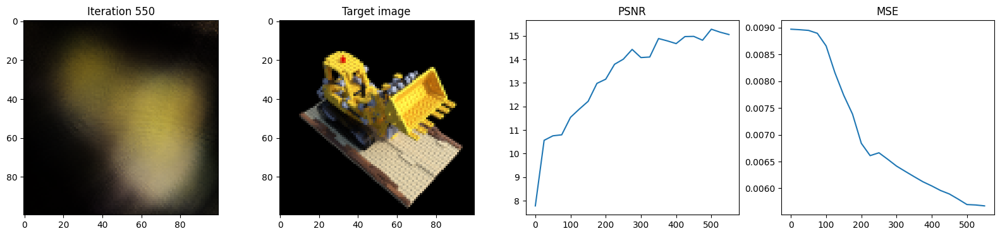

Iteration 575  Loss: 0.0375  PSNR: 14.26  Time: 0.32 secs per iter,  3.49 mins in total
The rotation error as compared to GT Rotation : 0.005663256160914898


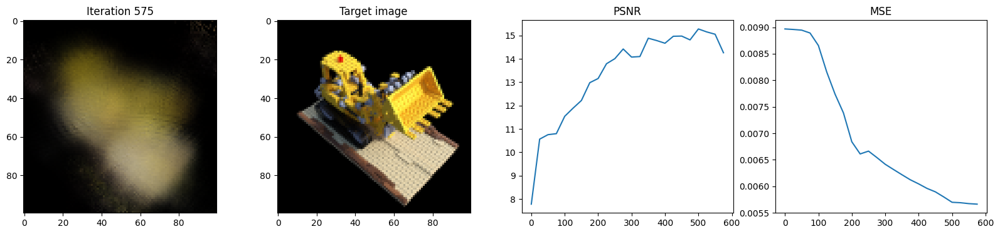

Iteration 600  Loss: 0.0270  PSNR: 15.69  Time: 0.32 secs per iter,  3.63 mins in total
The rotation error as compared to GT Rotation : 0.005656104069203138


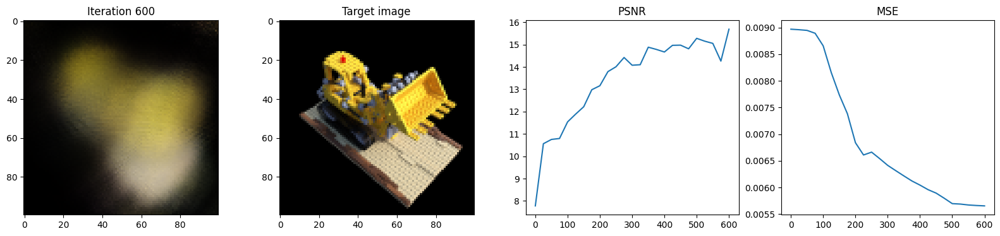

Iteration 625  Loss: 0.0276  PSNR: 15.58  Time: 0.32 secs per iter,  3.76 mins in total
The rotation error as compared to GT Rotation : 0.005645778030157089


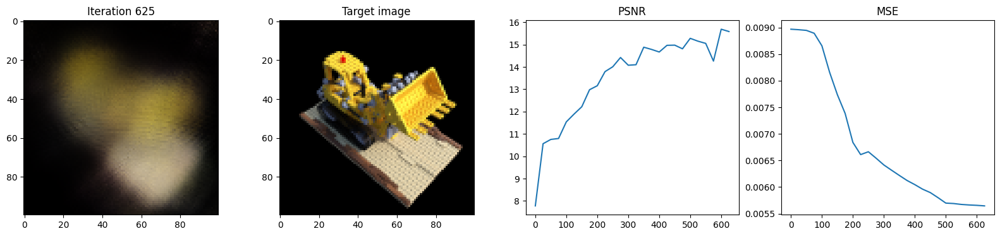

Iteration 650  Loss: 0.0272  PSNR: 15.65  Time: 0.32 secs per iter,  3.90 mins in total
The rotation error as compared to GT Rotation : 0.005633403547108173


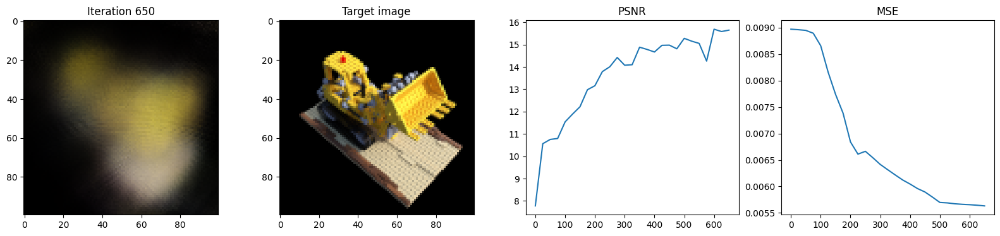

Iteration 675  Loss: 0.0286  PSNR: 15.44  Time: 0.32 secs per iter,  4.03 mins in total
The rotation error as compared to GT Rotation : 0.005621324758976698


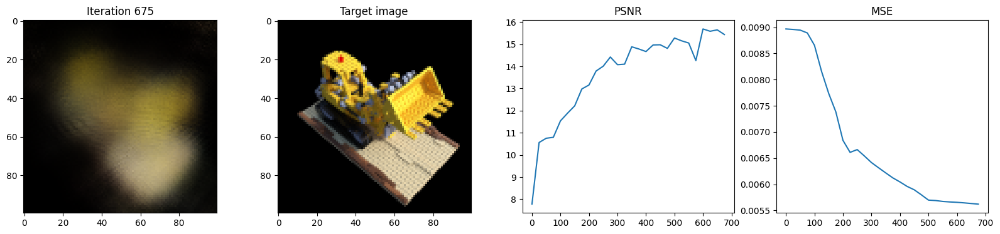

Iteration 700  Loss: 0.0287  PSNR: 15.41  Time: 0.32 secs per iter,  4.17 mins in total
The rotation error as compared to GT Rotation : 0.005604919977486134


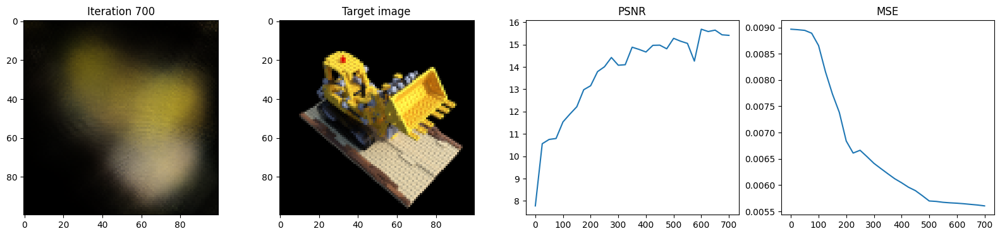

Iteration 725  Loss: 0.0261  PSNR: 15.83  Time: 0.33 secs per iter,  4.31 mins in total
The rotation error as compared to GT Rotation : 0.0055953762494027615


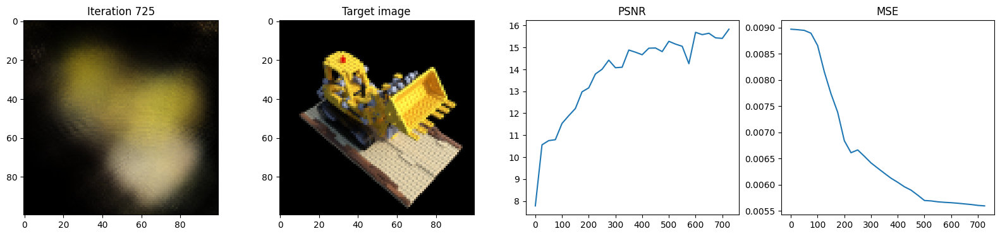

Iteration 750  Loss: 0.0239  PSNR: 16.22  Time: 0.32 secs per iter,  4.44 mins in total
The rotation error as compared to GT Rotation : 0.005586567334830761


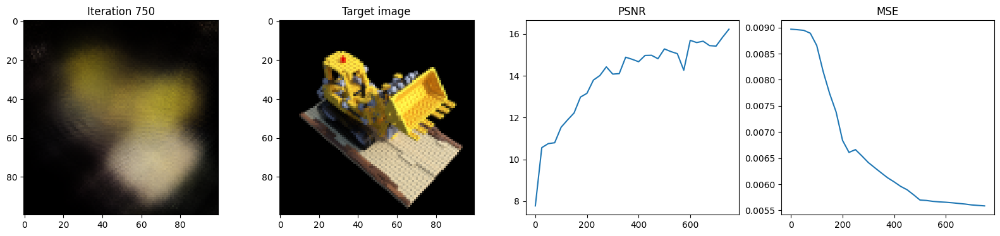

Iteration 775  Loss: 0.0237  PSNR: 16.25  Time: 0.32 secs per iter,  4.58 mins in total
The rotation error as compared to GT Rotation : 0.00558545021340251


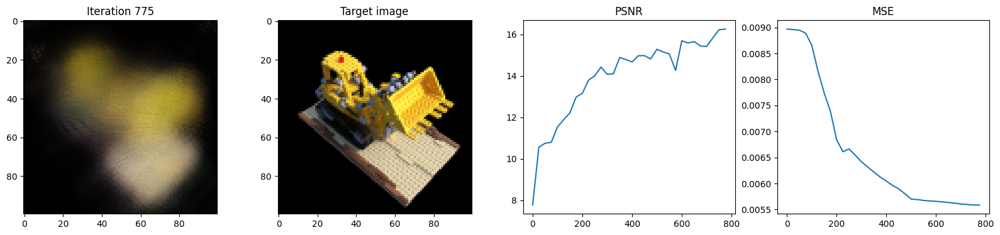

Iteration 800  Loss: 0.0243  PSNR: 16.15  Time: 0.32 secs per iter,  4.71 mins in total
The rotation error as compared to GT Rotation : 0.005584394093602896


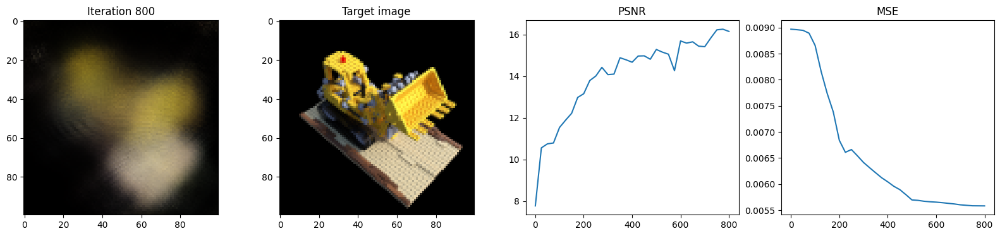

Iteration 825  Loss: 0.0270  PSNR: 15.68  Time: 0.32 secs per iter,  4.84 mins in total
The rotation error as compared to GT Rotation : 0.00558334169909358


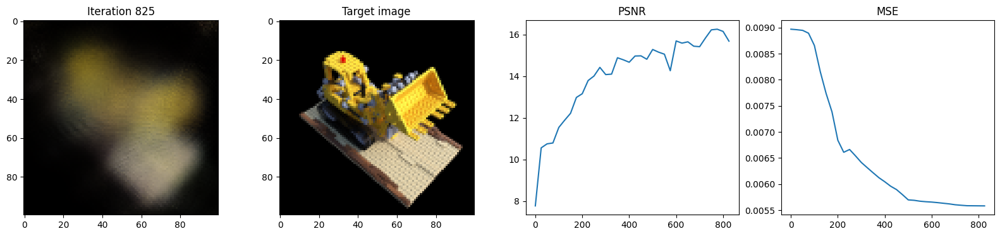

Iteration 850  Loss: 0.0252  PSNR: 15.98  Time: 0.32 secs per iter,  4.98 mins in total
The rotation error as compared to GT Rotation : 0.005582387559115887


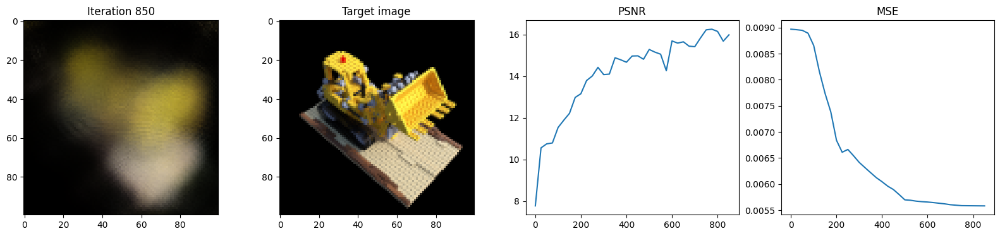

Iteration 875  Loss: 0.0254  PSNR: 15.96  Time: 0.32 secs per iter,  5.11 mins in total
The rotation error as compared to GT Rotation : 0.0055814385414123535


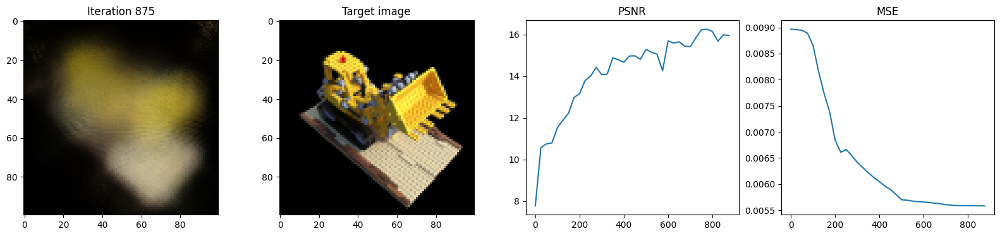

Iteration 900  Loss: 0.0219  PSNR: 16.59  Time: 0.32 secs per iter,  5.25 mins in total
The rotation error as compared to GT Rotation : 0.005580740049481392


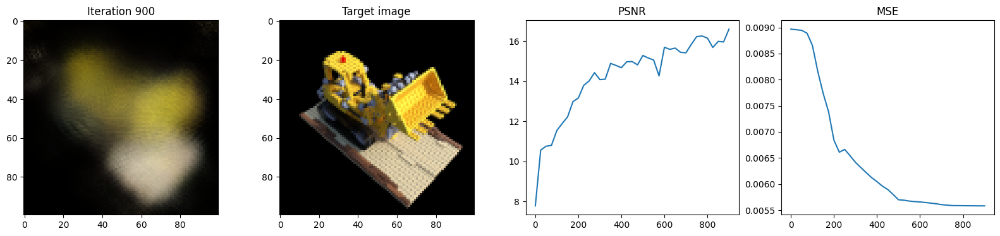

Iteration 925  Loss: 0.0234  PSNR: 16.30  Time: 0.32 secs per iter,  5.38 mins in total
The rotation error as compared to GT Rotation : 0.005579347722232342


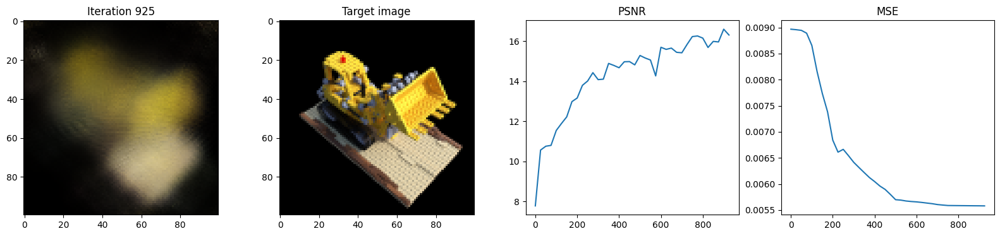

Iteration 950  Loss: 0.0231  PSNR: 16.36  Time: 0.33 secs per iter,  5.52 mins in total
The rotation error as compared to GT Rotation : 0.005578548647463322


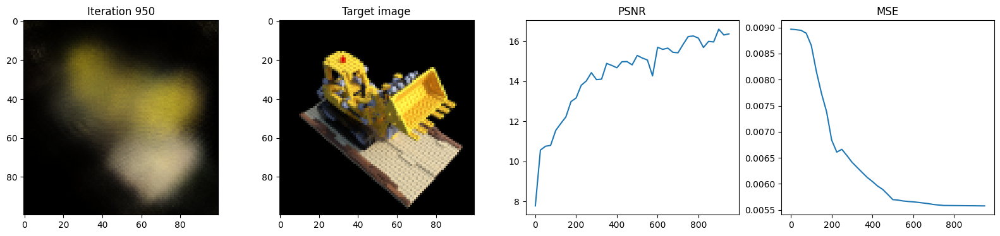

Iteration 975  Loss: 0.0258  PSNR: 15.89  Time: 0.32 secs per iter,  5.65 mins in total
The rotation error as compared to GT Rotation : 0.005577507428824902


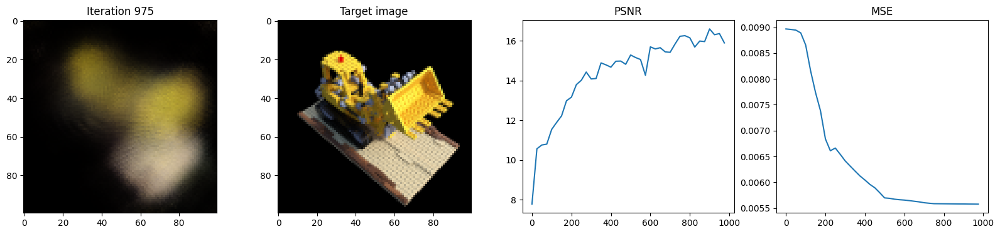

Iteration 1000  Loss: 0.0236  PSNR: 16.26  Time: 0.32 secs per iter,  5.79 mins in total
The rotation error as compared to GT Rotation : 0.005576437339186668


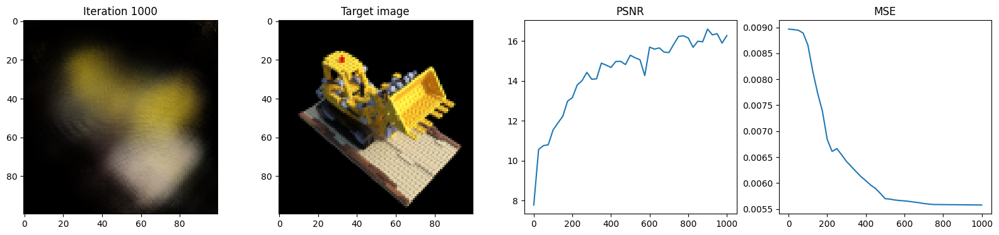

Iteration 1025  Loss: 0.0282  PSNR: 15.49  Time: 0.32 secs per iter,  5.92 mins in total
The rotation error as compared to GT Rotation : 0.005575590766966343


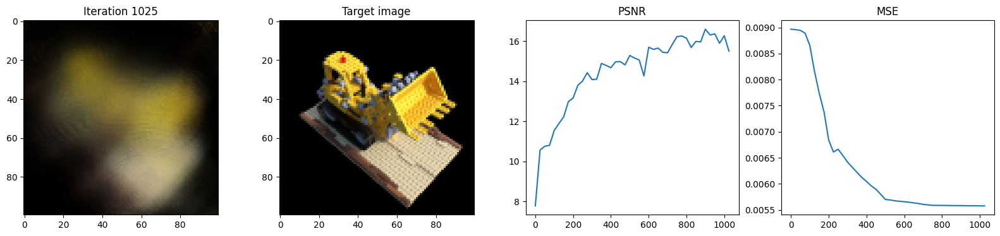

Iteration 1050  Loss: 0.0249  PSNR: 16.04  Time: 0.32 secs per iter,  6.06 mins in total
The rotation error as compared to GT Rotation : 0.005574786104261875


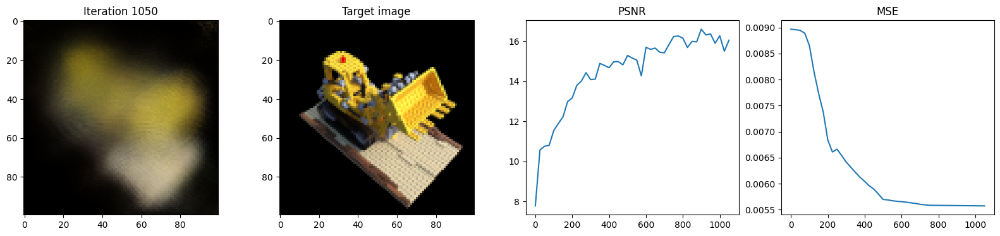

Iteration 1075  Loss: 0.0258  PSNR: 15.89  Time: 0.32 secs per iter,  6.19 mins in total
The rotation error as compared to GT Rotation : 0.0055740331299602985


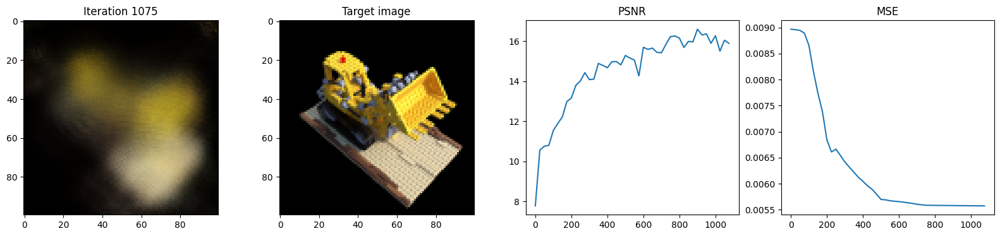

Iteration 1100  Loss: 0.0295  PSNR: 15.31  Time: 0.32 secs per iter,  6.33 mins in total
The rotation error as compared to GT Rotation : 0.005573061294853687


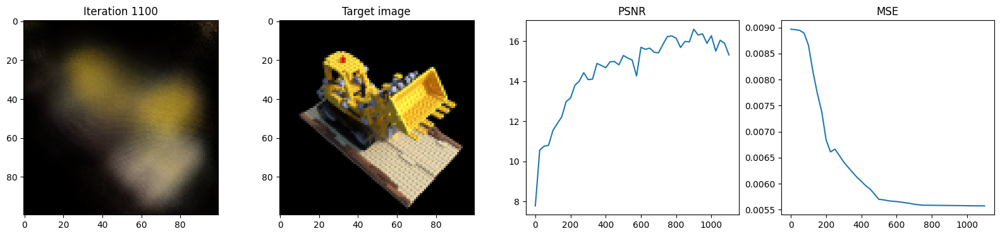

Iteration 1125  Loss: 0.0260  PSNR: 15.85  Time: 0.32 secs per iter,  6.46 mins in total
The rotation error as compared to GT Rotation : 0.005572326015681028


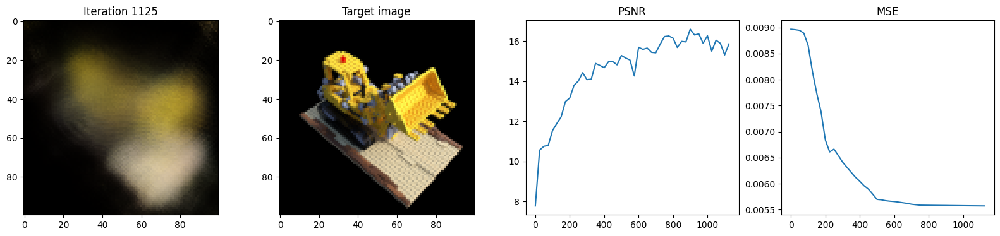

Iteration 1150  Loss: 0.0268  PSNR: 15.72  Time: 0.32 secs per iter,  6.59 mins in total
The rotation error as compared to GT Rotation : 0.005571457557380199


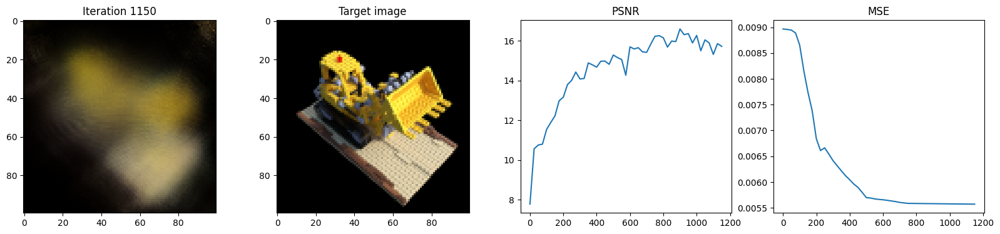

Iteration 1175  Loss: 0.0246  PSNR: 16.09  Time: 0.33 secs per iter,  6.73 mins in total
The rotation error as compared to GT Rotation : 0.005570374894887209


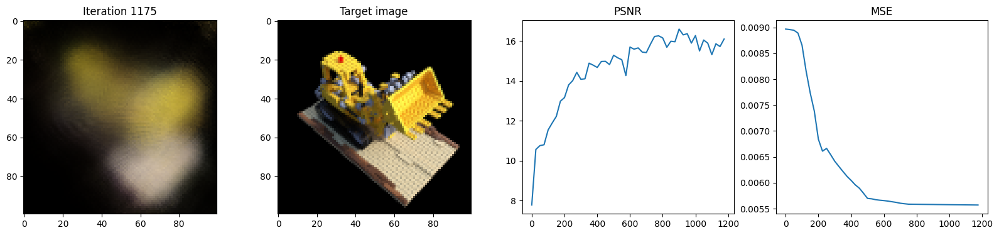

Iteration 1200  Loss: 0.0261  PSNR: 15.84  Time: 0.32 secs per iter,  6.87 mins in total
The rotation error as compared to GT Rotation : 0.005569134373217821


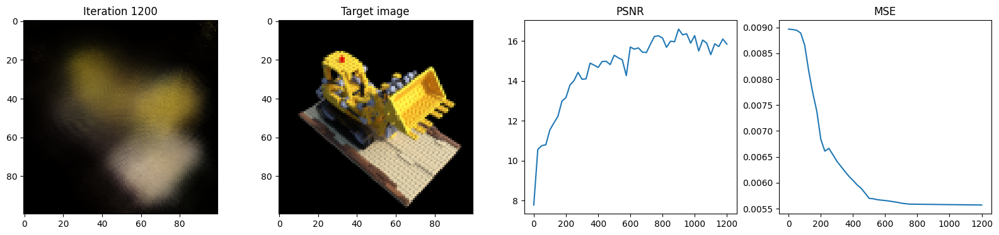

Iteration 1225  Loss: 0.0222  PSNR: 16.54  Time: 0.32 secs per iter,  7.00 mins in total
The rotation error as compared to GT Rotation : 0.005568521097302437


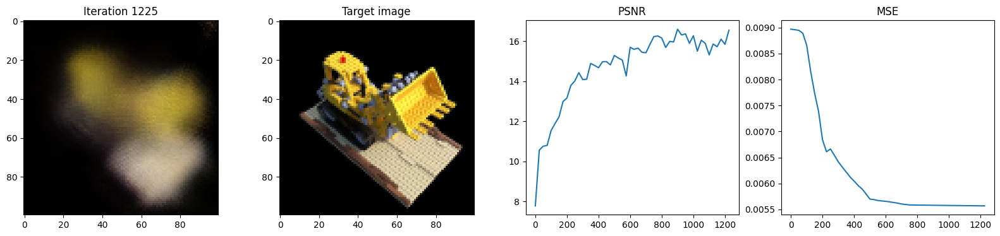

Iteration 1250  Loss: 0.0259  PSNR: 15.87  Time: 0.32 secs per iter,  7.13 mins in total
The rotation error as compared to GT Rotation : 0.005567485466599464


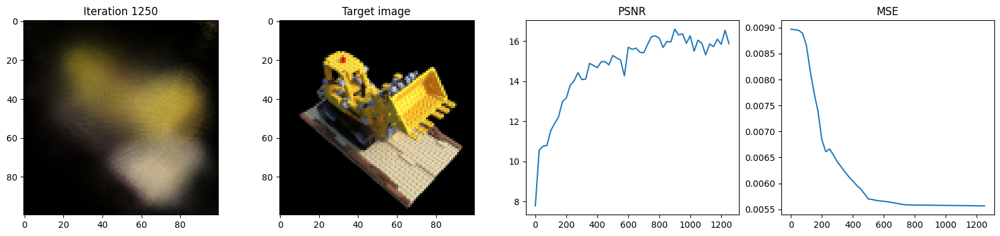

Iteration 1275  Loss: 0.0270  PSNR: 15.68  Time: 0.32 secs per iter,  7.27 mins in total
The rotation error as compared to GT Rotation : 0.005565961357206106


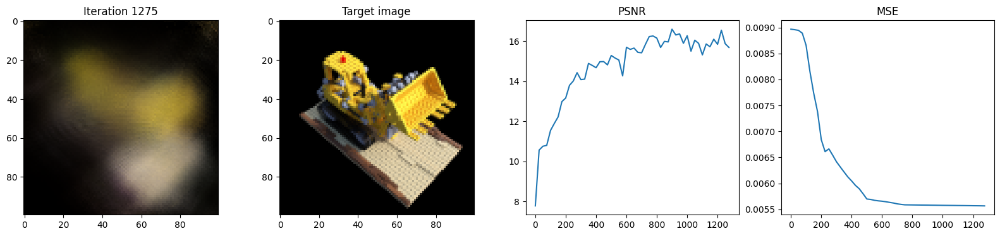

Iteration 1300  Loss: 0.0248  PSNR: 16.06  Time: 0.32 secs per iter,  7.40 mins in total
The rotation error as compared to GT Rotation : 0.005565199535340071


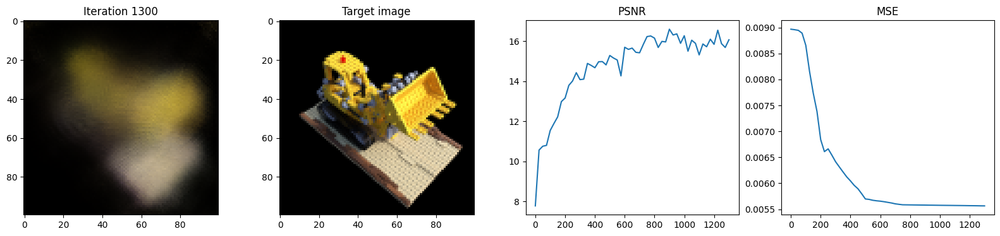

Iteration 1325  Loss: 0.0255  PSNR: 15.94  Time: 0.32 secs per iter,  7.54 mins in total
The rotation error as compared to GT Rotation : 0.005564000457525253


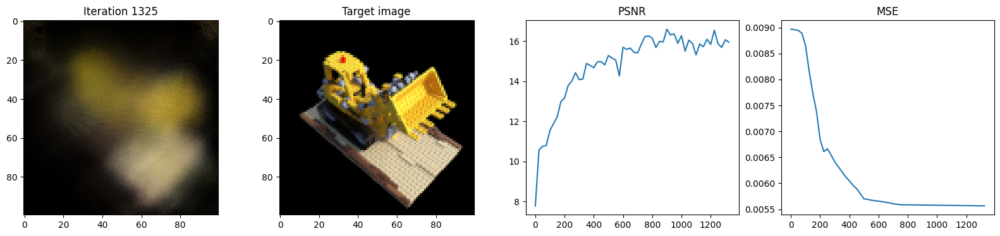

Iteration 1350  Loss: 0.0231  PSNR: 16.36  Time: 0.32 secs per iter,  7.67 mins in total
The rotation error as compared to GT Rotation : 0.005562740843743086


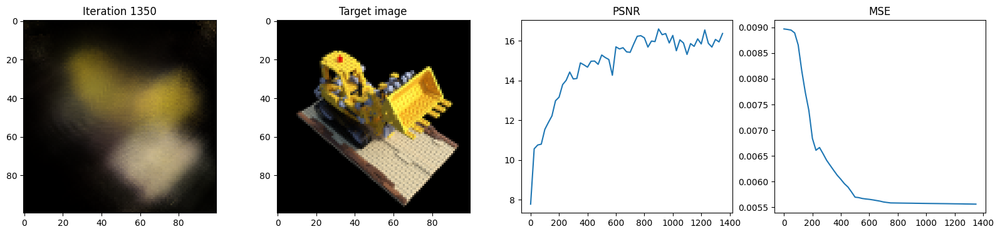

Iteration 1375  Loss: 0.0271  PSNR: 15.66  Time: 0.33 secs per iter,  7.81 mins in total
The rotation error as compared to GT Rotation : 0.005561462137848139


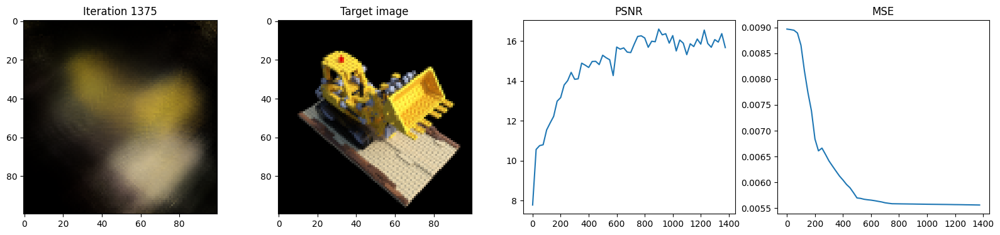

Iteration 1400  Loss: 0.0272  PSNR: 15.66  Time: 0.32 secs per iter,  7.94 mins in total
The rotation error as compared to GT Rotation : 0.005560513585805893


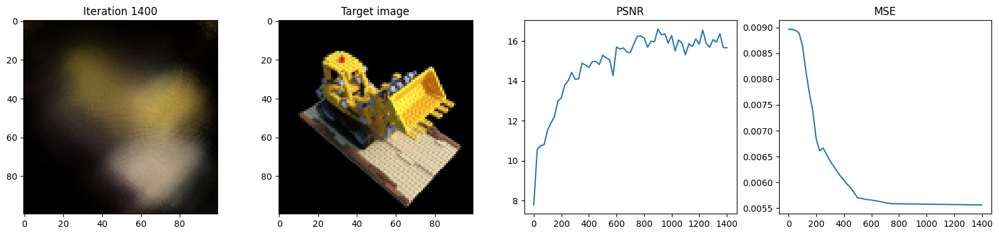

Iteration 1425  Loss: 0.0306  PSNR: 15.15  Time: 0.32 secs per iter,  8.08 mins in total
The rotation error as compared to GT Rotation : 0.005559617653489113


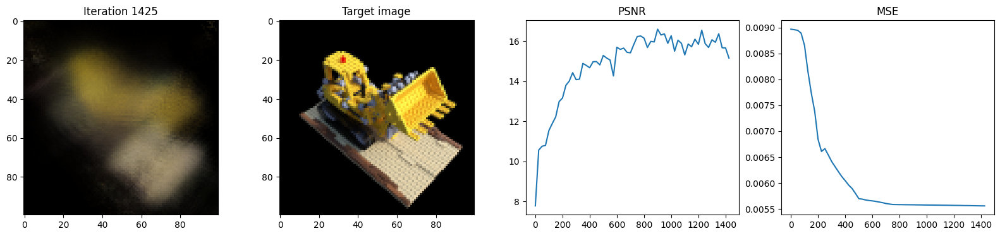

Iteration 1450  Loss: 0.0257  PSNR: 15.90  Time: 0.32 secs per iter,  8.21 mins in total
The rotation error as compared to GT Rotation : 0.005558549892157316


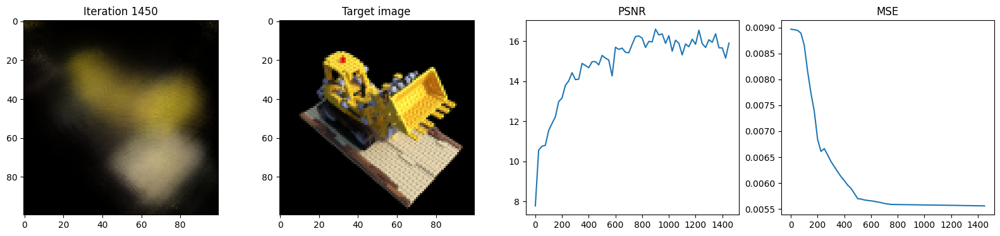

Iteration 1475  Loss: 0.0264  PSNR: 15.78  Time: 0.32 secs per iter,  8.35 mins in total
The rotation error as compared to GT Rotation : 0.005557703319936991


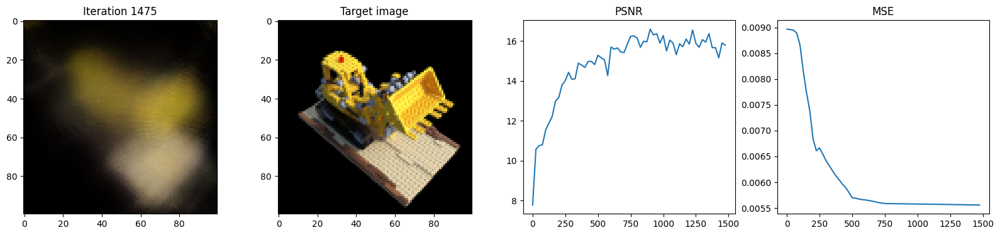

Iteration 1500  Loss: 0.0260  PSNR: 15.86  Time: 0.32 secs per iter,  8.48 mins in total
The rotation error as compared to GT Rotation : 0.005556622985750437


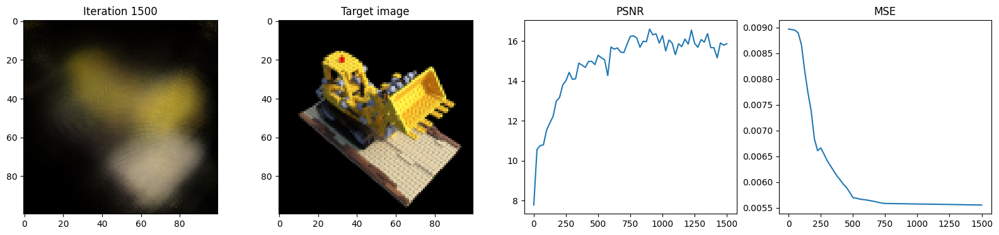

Iteration 1525  Loss: 0.0255  PSNR: 15.93  Time: 0.32 secs per iter,  8.62 mins in total
The rotation error as compared to GT Rotation : 0.005555528681725264


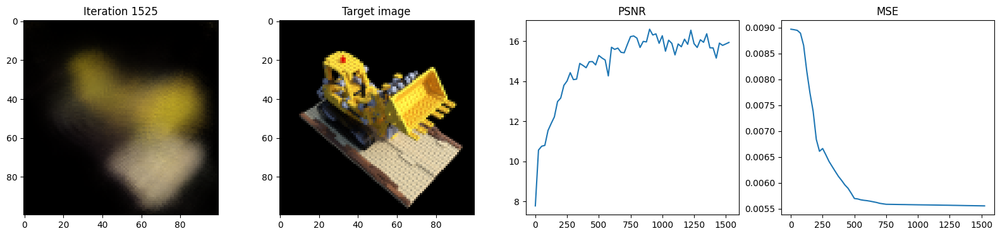

Iteration 1550  Loss: 0.0273  PSNR: 15.64  Time: 0.32 secs per iter,  8.75 mins in total
The rotation error as compared to GT Rotation : 0.005554673727601767


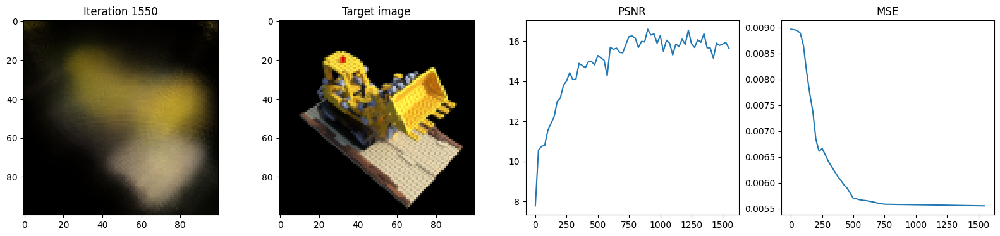

Iteration 1575  Loss: 0.0253  PSNR: 15.97  Time: 0.32 secs per iter,  8.89 mins in total
The rotation error as compared to GT Rotation : 0.0055534373968839645


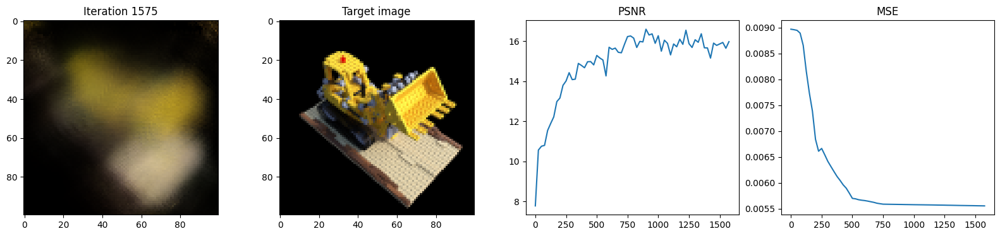

Iteration 1600  Loss: 0.0285  PSNR: 15.45  Time: 0.33 secs per iter,  9.02 mins in total
The rotation error as compared to GT Rotation : 0.005552254617214203


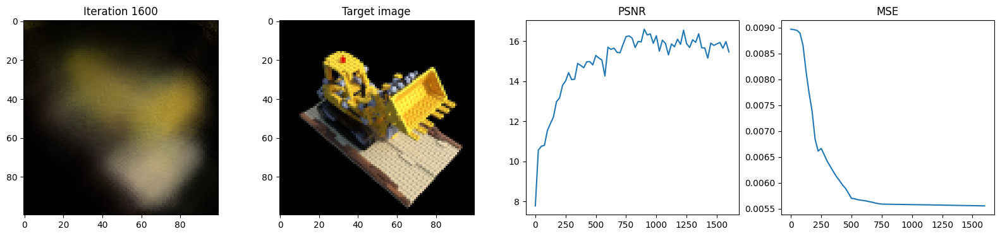

Iteration 1625  Loss: 0.0291  PSNR: 15.36  Time: 0.32 secs per iter,  9.16 mins in total
The rotation error as compared to GT Rotation : 0.005551560781896114


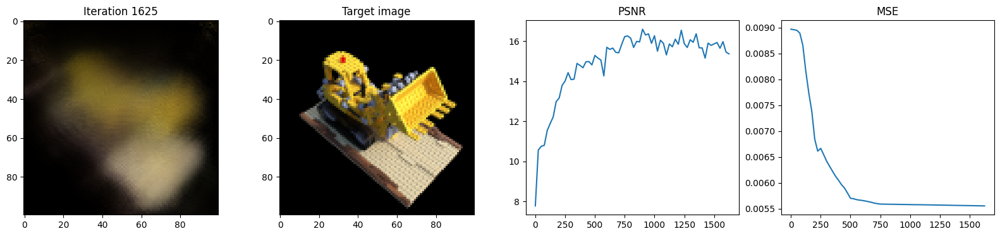

Iteration 1650  Loss: 0.0324  PSNR: 14.90  Time: 0.32 secs per iter,  9.29 mins in total
The rotation error as compared to GT Rotation : 0.005550277419388294


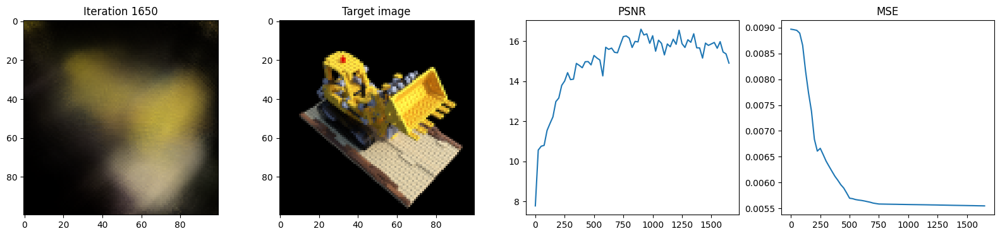

Iteration 1675  Loss: 0.0274  PSNR: 15.62  Time: 0.32 secs per iter,  9.43 mins in total
The rotation error as compared to GT Rotation : 0.005549222230911255


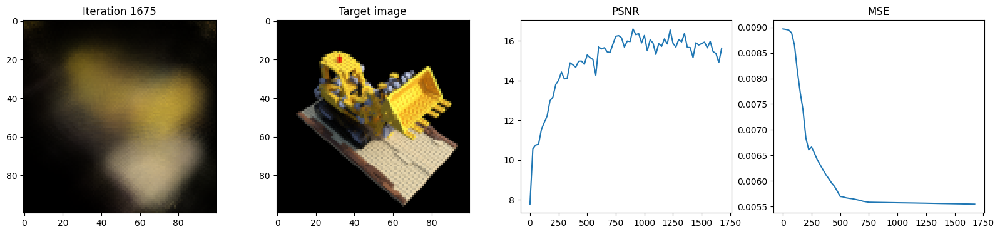

Iteration 1700  Loss: 0.0242  PSNR: 16.17  Time: 0.32 secs per iter,  9.56 mins in total
The rotation error as compared to GT Rotation : 0.005548344925045967


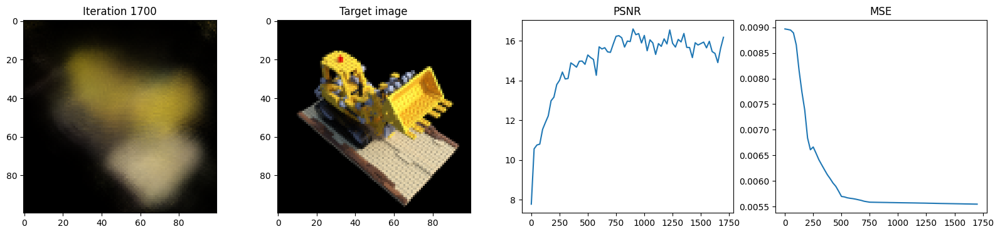

Iteration 1725  Loss: 0.0270  PSNR: 15.69  Time: 0.32 secs per iter,  9.69 mins in total
The rotation error as compared to GT Rotation : 0.005547302775084972


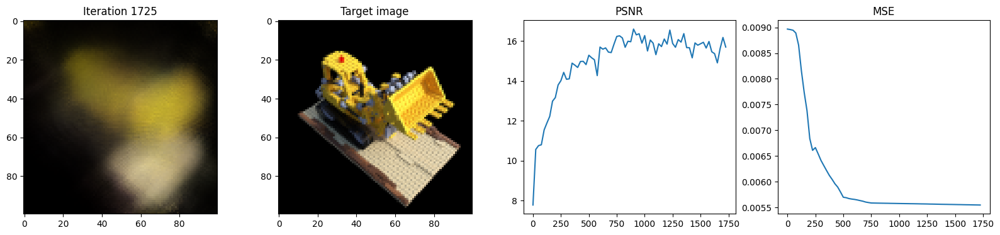

Iteration 1750  Loss: 0.0280  PSNR: 15.53  Time: 0.32 secs per iter,  9.83 mins in total
The rotation error as compared to GT Rotation : 0.005546184256672859


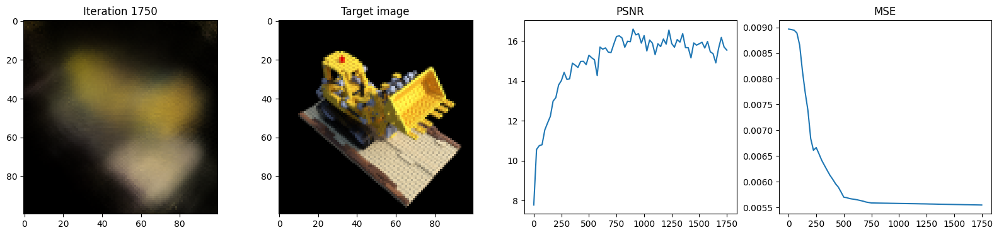

Iteration 1775  Loss: 0.0248  PSNR: 16.06  Time: 0.32 secs per iter,  9.96 mins in total
The rotation error as compared to GT Rotation : 0.005545179825276136


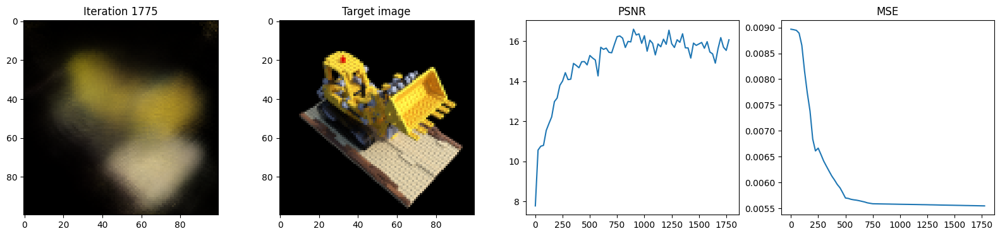

Iteration 1800  Loss: 0.0259  PSNR: 15.86  Time: 0.32 secs per iter,  10.10 mins in total
The rotation error as compared to GT Rotation : 0.005544291343539953


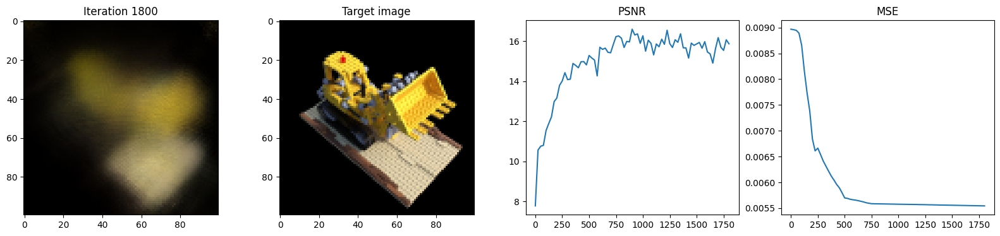

Iteration 1825  Loss: 0.0279  PSNR: 15.54  Time: 0.33 secs per iter,  10.24 mins in total
The rotation error as compared to GT Rotation : 0.005543170962482691


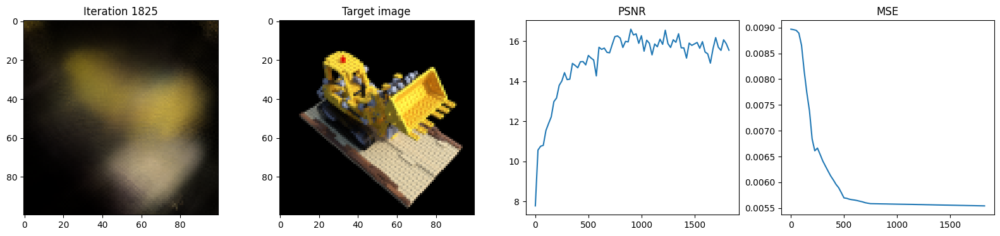

Iteration 1850  Loss: 0.0210  PSNR: 16.78  Time: 0.32 secs per iter,  10.37 mins in total
The rotation error as compared to GT Rotation : 0.005542335100471973


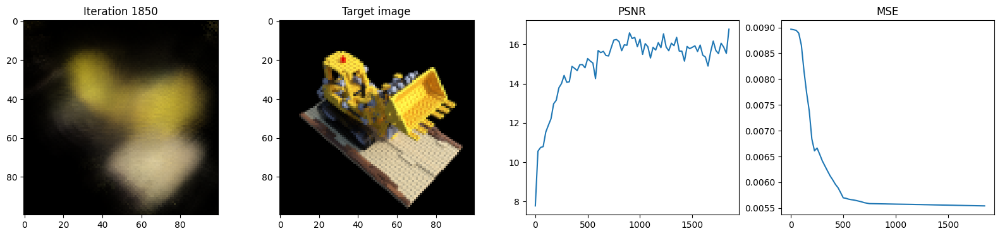

Iteration 1875  Loss: 0.0267  PSNR: 15.74  Time: 0.32 secs per iter,  10.50 mins in total
The rotation error as compared to GT Rotation : 0.005541233345866203


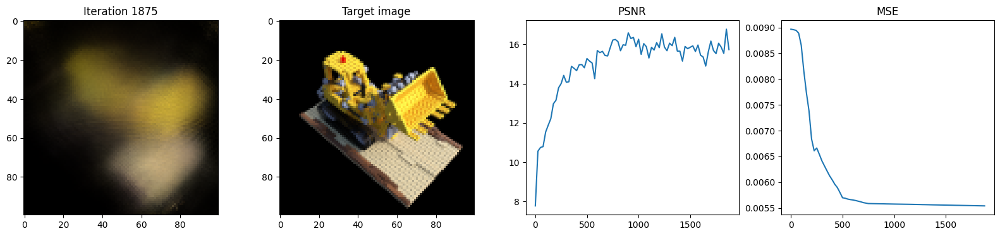

Iteration 1900  Loss: 0.0231  PSNR: 16.36  Time: 0.32 secs per iter,  10.64 mins in total
The rotation error as compared to GT Rotation : 0.005540452431887388


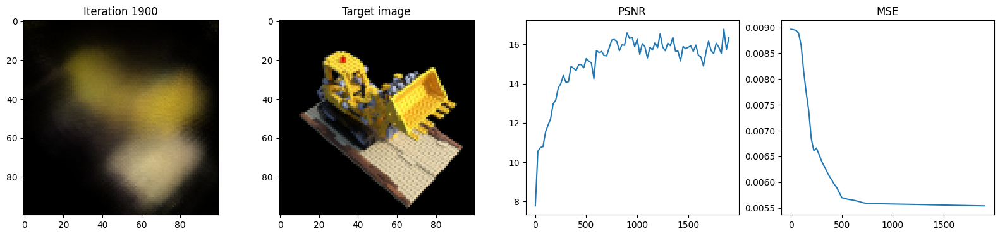

Iteration 1925  Loss: 0.0295  PSNR: 15.30  Time: 0.32 secs per iter,  10.77 mins in total
The rotation error as compared to GT Rotation : 0.005539282225072384


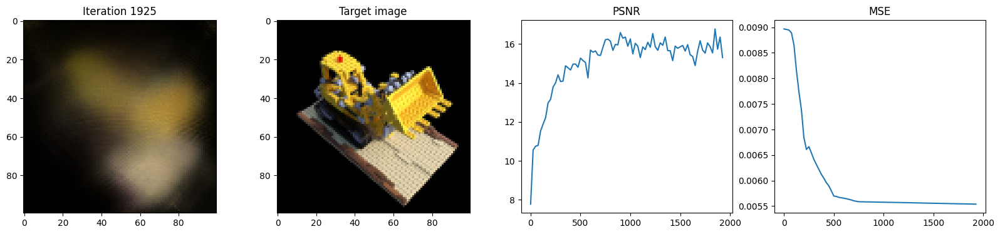

Iteration 1950  Loss: 0.0234  PSNR: 16.30  Time: 0.32 secs per iter,  10.91 mins in total
The rotation error as compared to GT Rotation : 0.005538416560739279


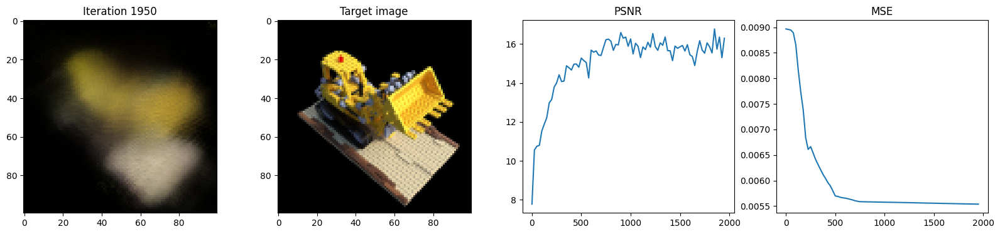

Iteration 1975  Loss: 0.0257  PSNR: 15.91  Time: 0.32 secs per iter,  11.04 mins in total
The rotation error as compared to GT Rotation : 0.005537544377148151


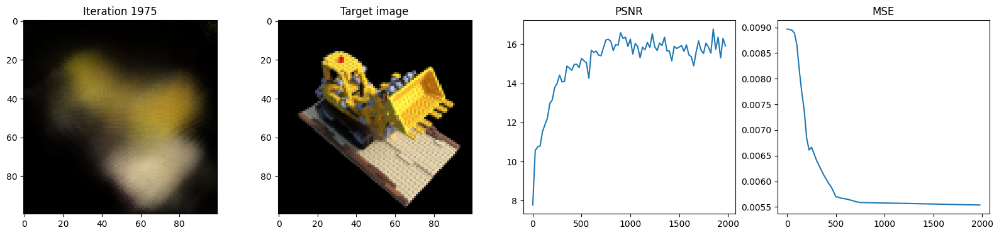

Iteration 2000  Loss: 0.0277  PSNR: 15.58  Time: 0.32 secs per iter,  11.17 mins in total
The rotation error as compared to GT Rotation : 0.005536620505154133


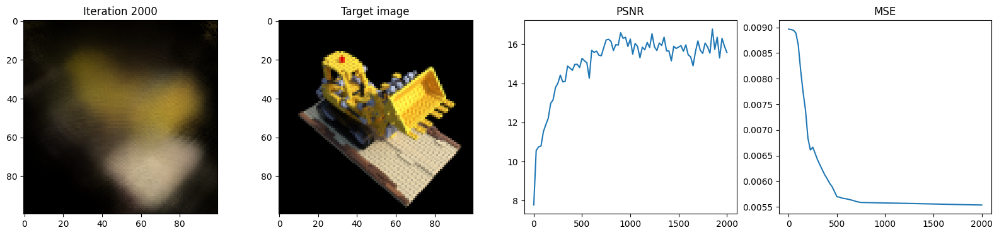

Iteration 2025  Loss: 0.0256  PSNR: 15.92  Time: 0.32 secs per iter,  11.31 mins in total
The rotation error as compared to GT Rotation : 0.005535684060305357


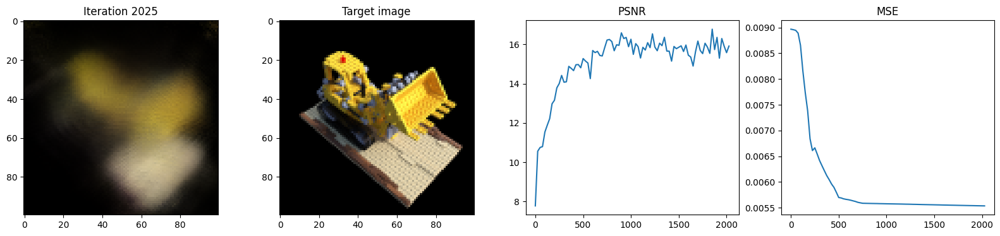

Iteration 2050  Loss: 0.0238  PSNR: 16.23  Time: 0.33 secs per iter,  11.45 mins in total
The rotation error as compared to GT Rotation : 0.00553488964214921


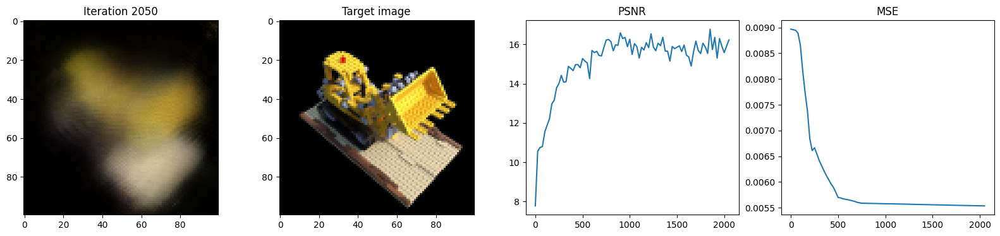

Iteration 2075  Loss: 0.0323  PSNR: 14.91  Time: 0.32 secs per iter,  11.58 mins in total
The rotation error as compared to GT Rotation : 0.005533774383366108


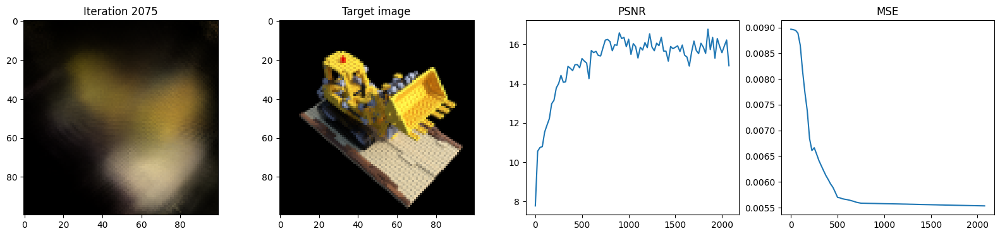

Iteration 2100  Loss: 0.0320  PSNR: 14.95  Time: 0.32 secs per iter,  11.71 mins in total
The rotation error as compared to GT Rotation : 0.005532749928534031


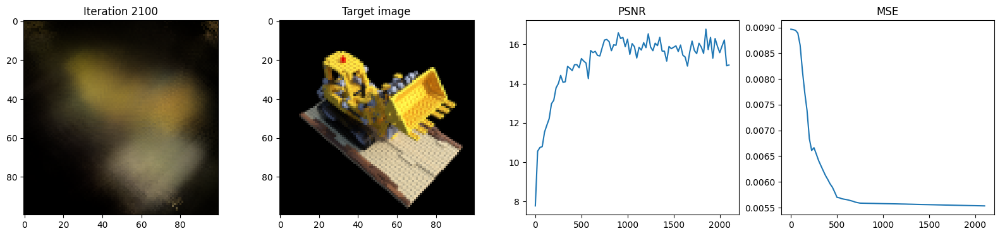

Iteration 2125  Loss: 0.0264  PSNR: 15.78  Time: 0.32 secs per iter,  11.85 mins in total
The rotation error as compared to GT Rotation : 0.005531872157007456


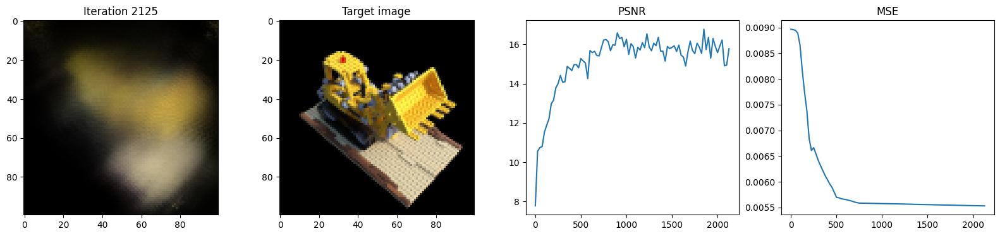

Iteration 2150  Loss: 0.0243  PSNR: 16.14  Time: 0.32 secs per iter,  11.98 mins in total
The rotation error as compared to GT Rotation : 0.005531050730496645


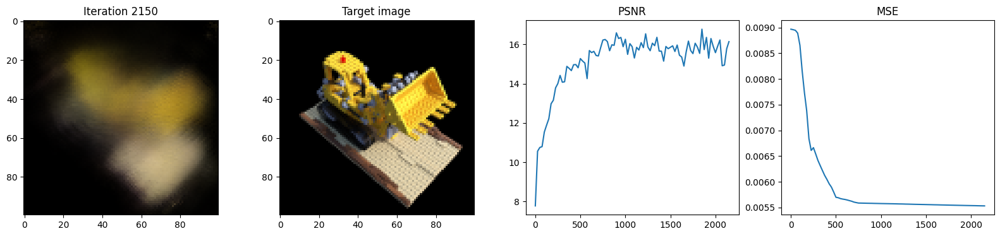

Iteration 2175  Loss: 0.0249  PSNR: 16.04  Time: 0.32 secs per iter,  12.12 mins in total
The rotation error as compared to GT Rotation : 0.005530519876629114


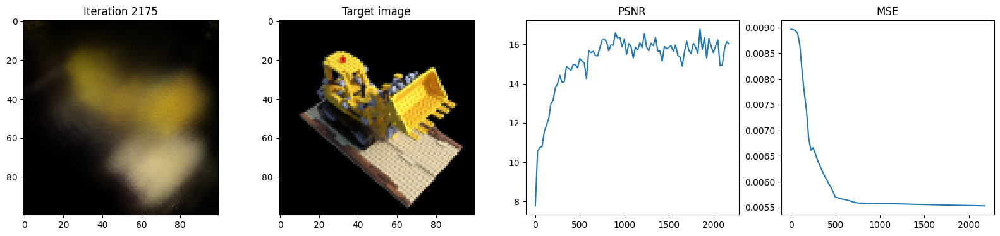

Iteration 2200  Loss: 0.0251  PSNR: 16.00  Time: 0.32 secs per iter,  12.25 mins in total
The rotation error as compared to GT Rotation : 0.005529488902539015


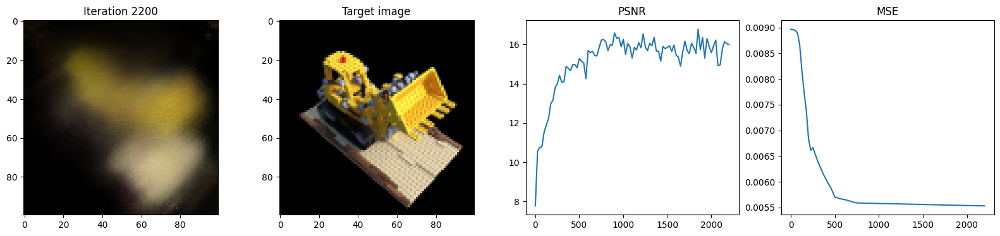

Iteration 2225  Loss: 0.0278  PSNR: 15.55  Time: 0.32 secs per iter,  12.39 mins in total
The rotation error as compared to GT Rotation : 0.0055287182331085205


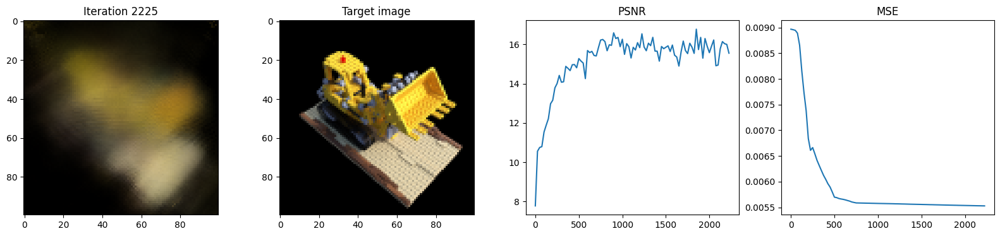

Iteration 2250  Loss: 0.0248  PSNR: 16.05  Time: 0.32 secs per iter,  12.52 mins in total
The rotation error as compared to GT Rotation : 0.005527786444872618


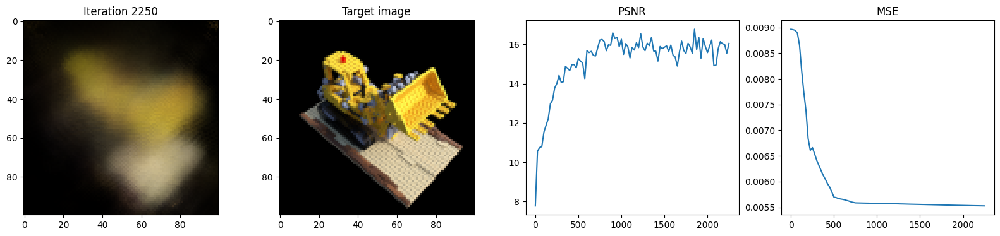

Iteration 2275  Loss: 0.0215  PSNR: 16.67  Time: 0.33 secs per iter,  12.66 mins in total
The rotation error as compared to GT Rotation : 0.005527145694941282


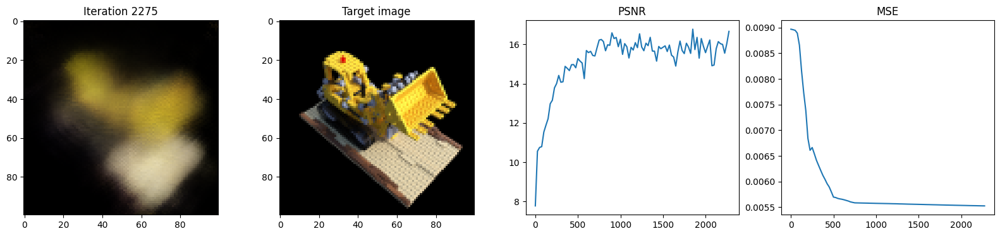

Iteration 2300  Loss: 0.0247  PSNR: 16.07  Time: 0.32 secs per iter,  12.79 mins in total
The rotation error as compared to GT Rotation : 0.005525991786271334


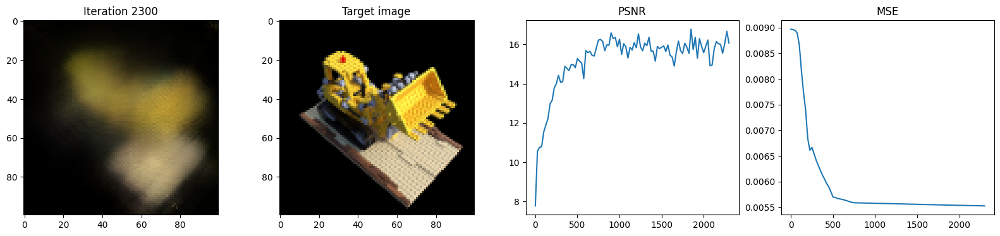

Iteration 2325  Loss: 0.0247  PSNR: 16.07  Time: 0.32 secs per iter,  12.93 mins in total
The rotation error as compared to GT Rotation : 0.005524678621441126


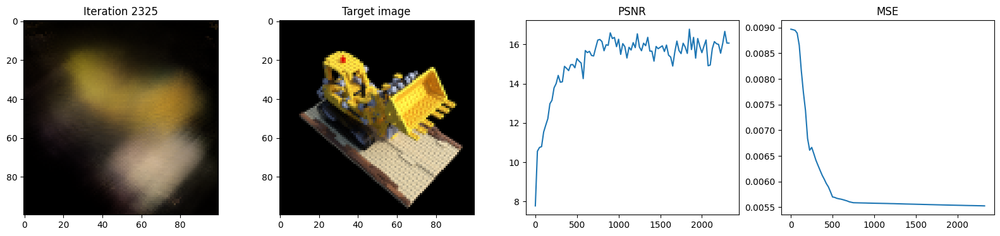

Iteration 2350  Loss: 0.0234  PSNR: 16.31  Time: 0.32 secs per iter,  13.06 mins in total
The rotation error as compared to GT Rotation : 0.0055237519554793835


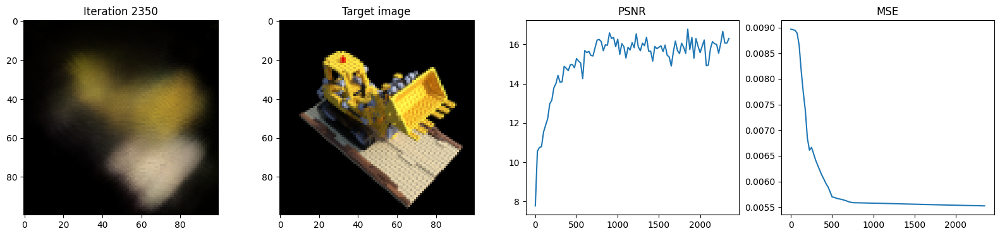

Iteration 2375  Loss: 0.0240  PSNR: 16.20  Time: 0.32 secs per iter,  13.19 mins in total
The rotation error as compared to GT Rotation : 0.0055230166763067245


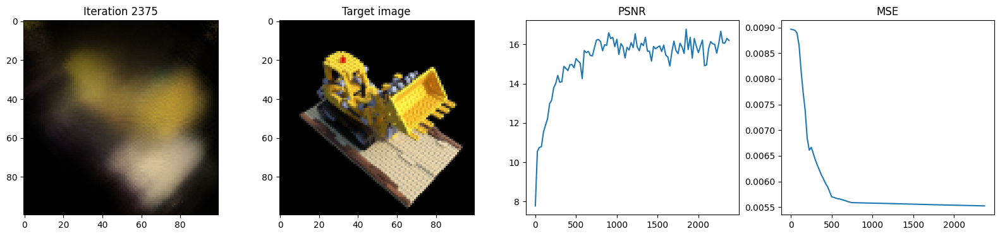

Iteration 2400  Loss: 0.0296  PSNR: 15.29  Time: 0.32 secs per iter,  13.33 mins in total
The rotation error as compared to GT Rotation : 0.005521690472960472


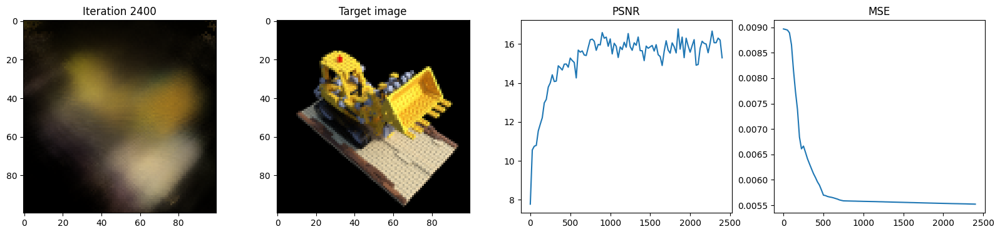

Iteration 2425  Loss: 0.0229  PSNR: 16.41  Time: 0.32 secs per iter,  13.46 mins in total
The rotation error as compared to GT Rotation : 0.00552079314365983


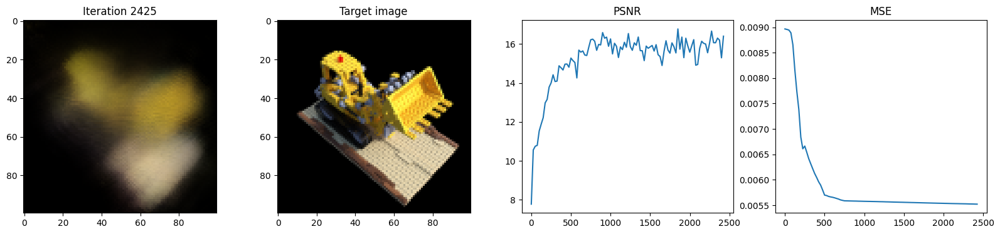

Iteration 2450  Loss: 0.0259  PSNR: 15.87  Time: 0.32 secs per iter,  13.60 mins in total
The rotation error as compared to GT Rotation : 0.005519837141036987


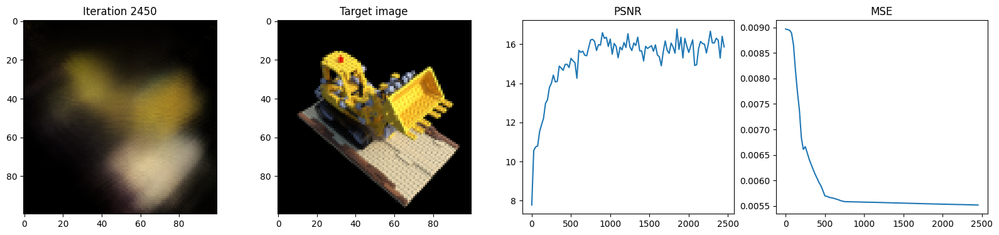

Iteration 2475  Loss: 0.0227  PSNR: 16.43  Time: 0.32 secs per iter,  13.73 mins in total
The rotation error as compared to GT Rotation : 0.005519164726138115


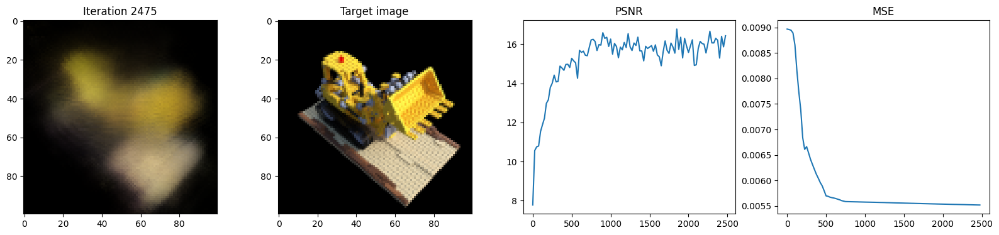

Iteration 2500  Loss: 0.0262  PSNR: 15.82  Time: 0.33 secs per iter,  13.87 mins in total
The rotation error as compared to GT Rotation : 0.005517986137419939


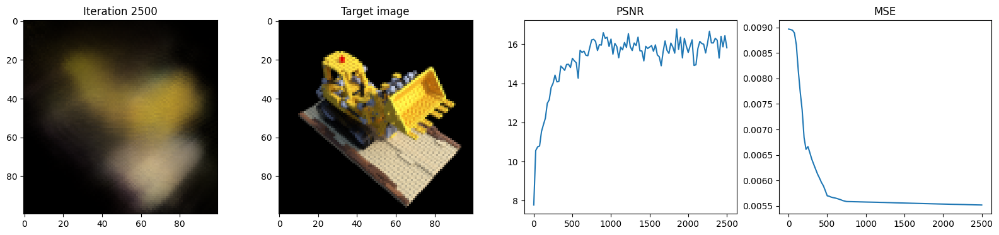

Iteration 2525  Loss: 0.0234  PSNR: 16.31  Time: 0.32 secs per iter,  14.00 mins in total
The rotation error as compared to GT Rotation : 0.005517081823199987


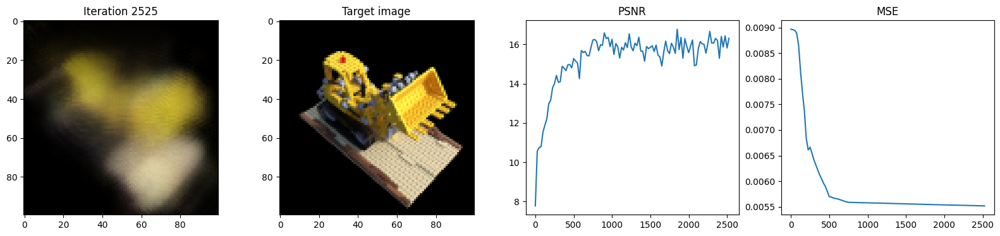

Iteration 2550  Loss: 0.0227  PSNR: 16.44  Time: 0.32 secs per iter,  14.14 mins in total
The rotation error as compared to GT Rotation : 0.0055162012577056885


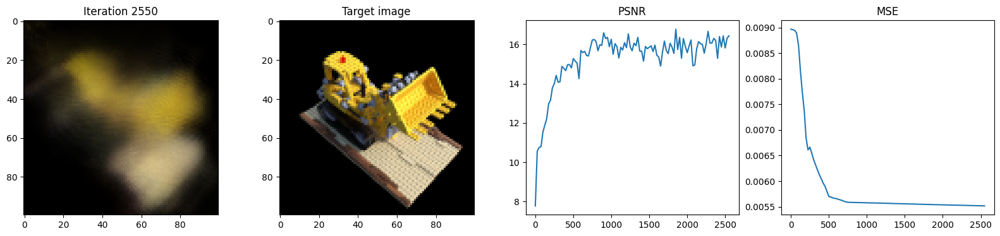

Iteration 2575  Loss: 0.0278  PSNR: 15.56  Time: 0.32 secs per iter,  14.27 mins in total
The rotation error as compared to GT Rotation : 0.005515327677130699


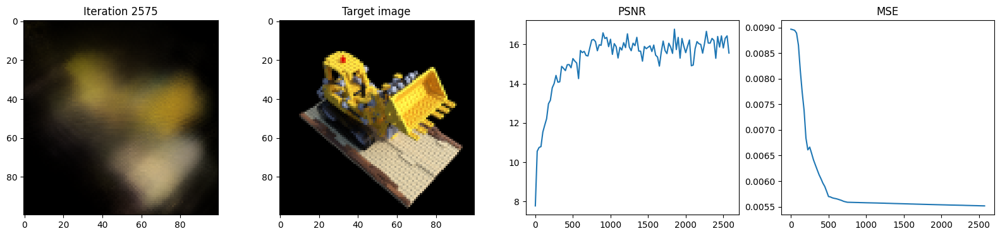

Iteration 2600  Loss: 0.0255  PSNR: 15.94  Time: 0.32 secs per iter,  14.40 mins in total
The rotation error as compared to GT Rotation : 0.005514359567314386


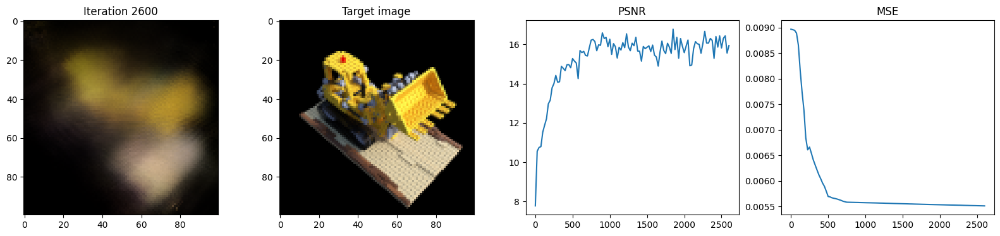

Iteration 2625  Loss: 0.0238  PSNR: 16.24  Time: 0.32 secs per iter,  14.54 mins in total
The rotation error as compared to GT Rotation : 0.0055133323185145855


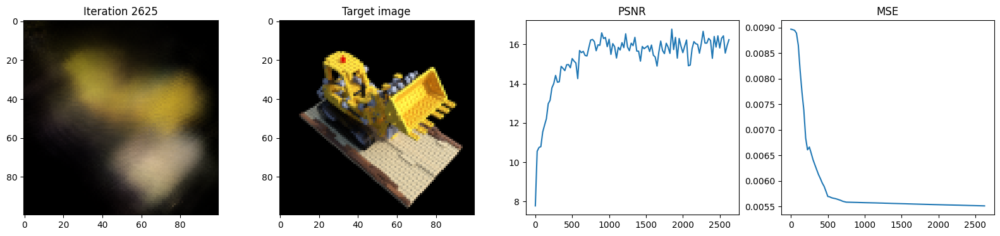

Iteration 2650  Loss: 0.0235  PSNR: 16.30  Time: 0.32 secs per iter,  14.67 mins in total
The rotation error as compared to GT Rotation : 0.005512371193617582


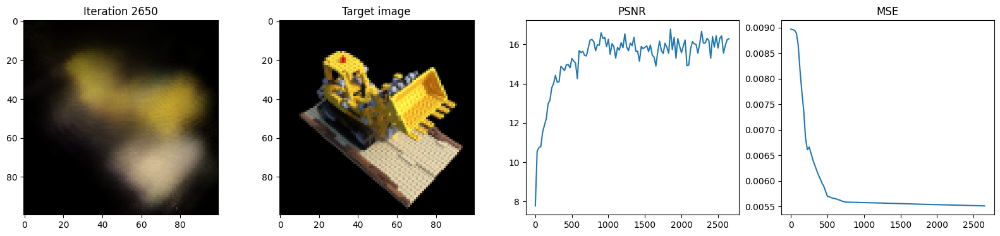

Iteration 2675  Loss: 0.0246  PSNR: 16.09  Time: 0.32 secs per iter,  14.81 mins in total
The rotation error as compared to GT Rotation : 0.0055111306719481945


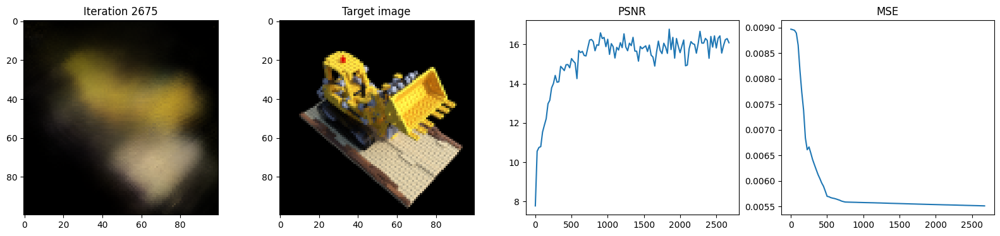

Iteration 2700  Loss: 0.0219  PSNR: 16.60  Time: 0.32 secs per iter,  14.94 mins in total
The rotation error as compared to GT Rotation : 0.005510356742888689


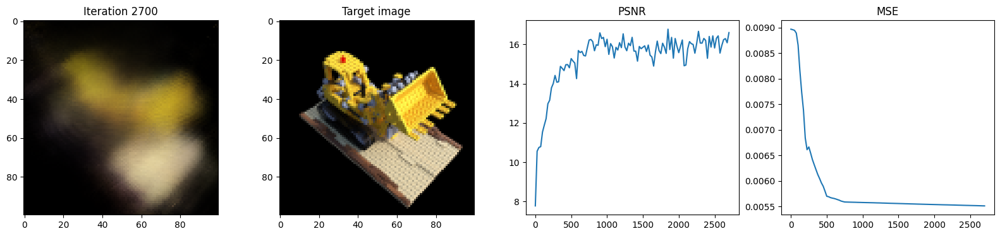

Iteration 2725  Loss: 0.0241  PSNR: 16.18  Time: 0.33 secs per iter,  15.08 mins in total
The rotation error as compared to GT Rotation : 0.005509223323315382


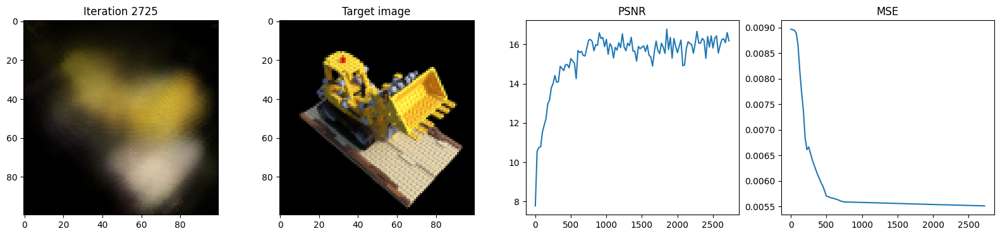

Iteration 2750  Loss: 0.0247  PSNR: 16.08  Time: 0.32 secs per iter,  15.21 mins in total
The rotation error as compared to GT Rotation : 0.005508444271981716


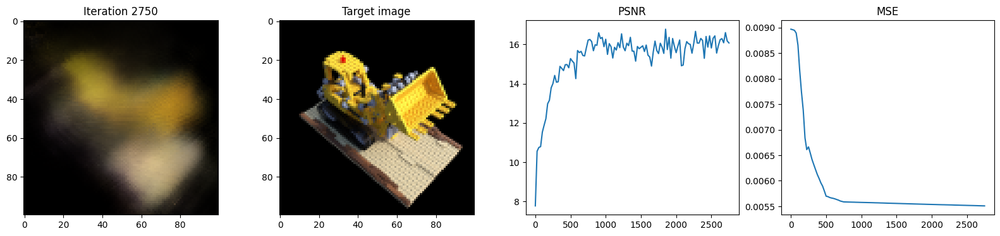

Iteration 2775  Loss: 0.0257  PSNR: 15.91  Time: 0.32 secs per iter,  15.35 mins in total
The rotation error as compared to GT Rotation : 0.005507723428308964


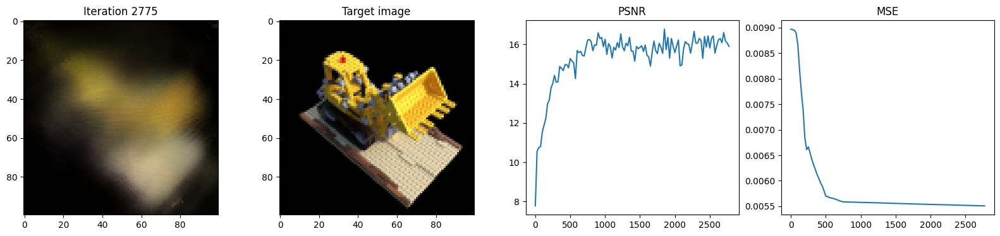

Iteration 2800  Loss: 0.0268  PSNR: 15.71  Time: 0.32 secs per iter,  15.48 mins in total
The rotation error as compared to GT Rotation : 0.005506705492734909


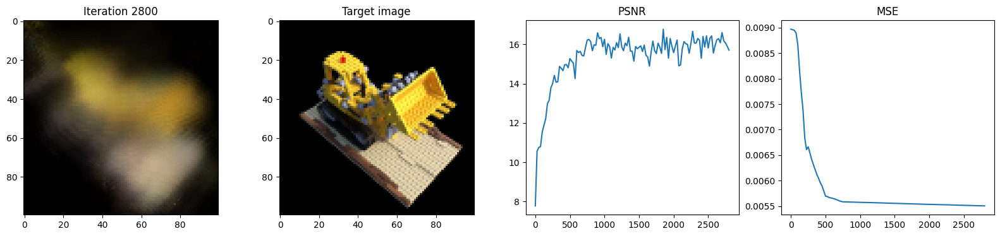

Iteration 2825  Loss: 0.0249  PSNR: 16.04  Time: 0.32 secs per iter,  15.61 mins in total
The rotation error as compared to GT Rotation : 0.005505561828613281


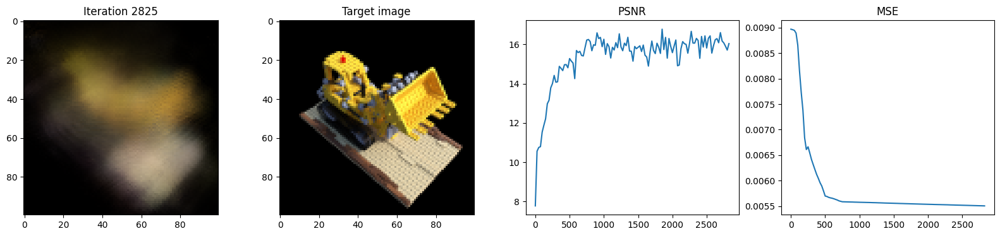

Iteration 2850  Loss: 0.0202  PSNR: 16.95  Time: 0.32 secs per iter,  15.75 mins in total
The rotation error as compared to GT Rotation : 0.005504733417183161


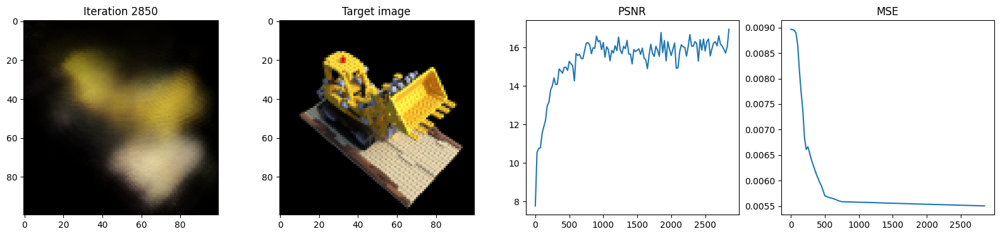

Iteration 2875  Loss: 0.0209  PSNR: 16.80  Time: 0.32 secs per iter,  15.88 mins in total
The rotation error as compared to GT Rotation : 0.005504193715751171


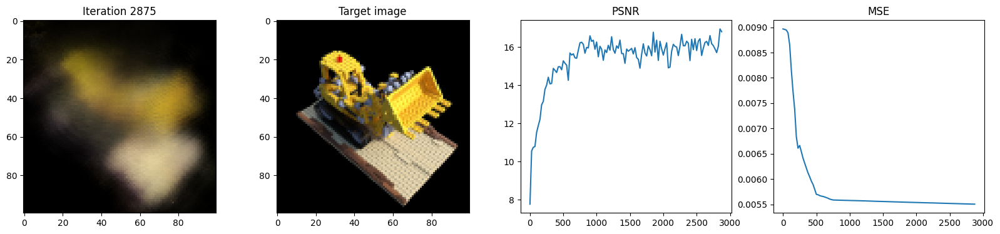

Iteration 2900  Loss: 0.0240  PSNR: 16.20  Time: 0.32 secs per iter,  16.02 mins in total
The rotation error as compared to GT Rotation : 0.005502943880856037


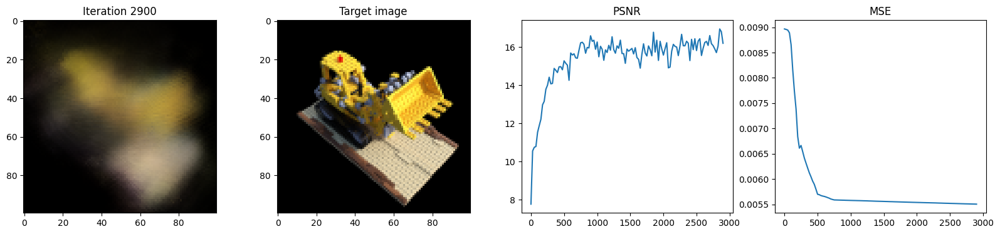

Iteration 2925  Loss: 0.0260  PSNR: 15.85  Time: 0.32 secs per iter,  16.15 mins in total
The rotation error as compared to GT Rotation : 0.005501975305378437


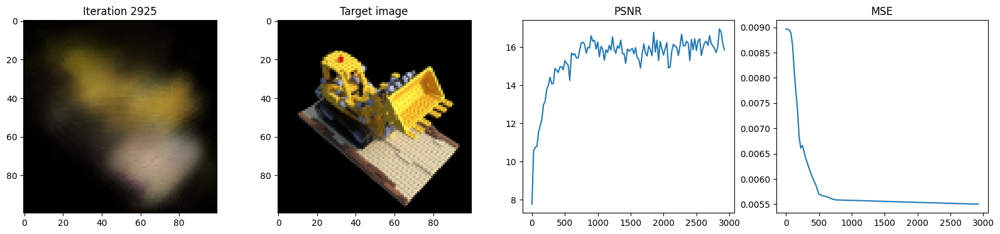

Iteration 2950  Loss: 0.0253  PSNR: 15.97  Time: 0.33 secs per iter,  16.29 mins in total
The rotation error as compared to GT Rotation : 0.005501172039657831


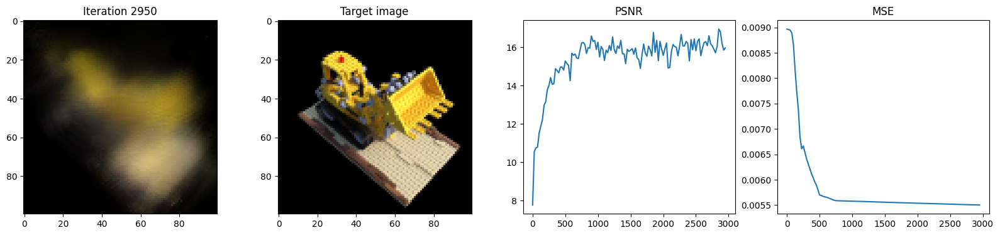

Iteration 2975  Loss: 0.0270  PSNR: 15.69  Time: 0.32 secs per iter,  16.42 mins in total
The rotation error as compared to GT Rotation : 0.005499630235135555


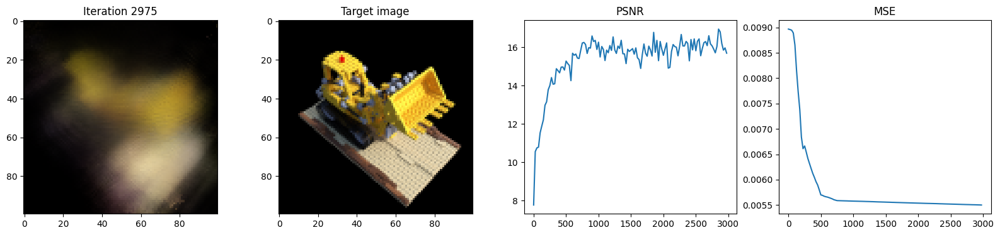

Iteration 3000  Loss: 0.0235  PSNR: 16.28  Time: 0.32 secs per iter,  16.56 mins in total
The rotation error as compared to GT Rotation : 0.005498910788446665


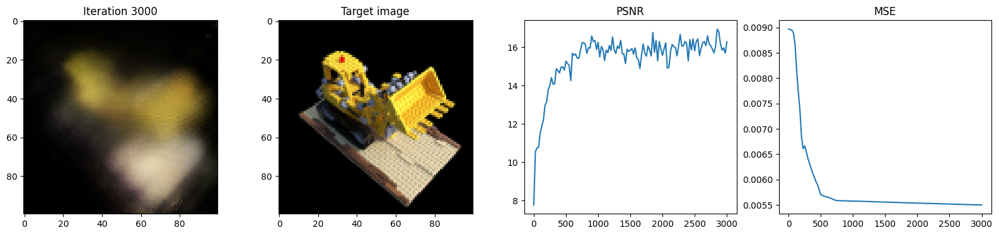

Done!


In [85]:
for i in range(iterations+1):



    
    output_image_idx = np.random.choice(images.shape[0])
    output_image = images[output_image_idx,...]
    
    euler_angles = euler_angles_all[output_image_idx,...].to(device)

    x = euler_angles[0].reshape(1).requires_grad_()
    y = euler_angles[1].reshape(1).requires_grad_()
    z = euler_angles[2].reshape(1).requires_grad_()
    
    tensor_0 = torch.zeros(1).to(device)
    tensor_1 = torch.ones(1).to(device)
    
    Rx = torch.stack([
                torch.stack([tensor_1, tensor_0, tensor_0]),
                torch.stack([tensor_0, torch.cos(x), -torch.sin(x)]),
                torch.stack([tensor_0, torch.sin(x), torch.cos(x)])]).reshape(3,3)
    Ry = torch.stack([
                torch.stack([torch.cos(y), tensor_0, torch.sin(y)]),
                torch.stack([tensor_0, tensor_1, tensor_0]),
                torch.stack([-torch.sin(y), tensor_0, torch.cos(y)])]).reshape(3,3)
    Rz = torch.stack([
                torch.stack([torch.cos(z), -torch.sin(z), tensor_0]),
                torch.stack([torch.sin(z), torch.cos(z), tensor_0]),
                torch.stack([tensor_0, tensor_0, tensor_1])]).reshape(3,3)
    Rx.retain_grad()
    Ry.retain_grad()
    Rz.retain_grad()
    w_R_c = Rz @ Ry @ Rx
    w_R_c = w_R_c.to(device)
    w_T_c = w_T_c_all[output_image_idx,...].to(device)
    
    optimizer.zero_grad()
    rec_image = one_forward_pass(height, width, intrinsics, w_R_c, w_T_c, near, far, samples, model, num_x_frequencies, num_d_frequencies)

    loss = criterion(rec_image, output_image)
    loss.backward()
    

    euler_angles_grad = torch.tensor([x.grad, y.grad, z.grad]).to(device)
    euler_angles_all[output_image_idx,...] = euler_angles - lr_rotation * euler_angles_grad
    
    
    
    
    optimizer.step()
    
    running_loss += loss.item()
    psnr = 10 * torch.log10((torch.max(output_image)**2)/loss.item())
    running_psnr += psnr.item()
    

    
    if i % display == 0:
        with torch.no_grad():

            
            test_rec_image = one_forward_pass(height, width, intrinsics, test_pose_w_R_c, test_pose_w_T_c, near, far, samples, model, num_x_frequencies, num_d_frequencies)


            
            loss = criterion(test_rec_image, test_image)
        psnr = 10 * torch.log10((torch.max(test_image)**2)/loss.item())
        
        mse_loss_euler = criterion(euler_angles_all_orig, euler_angles_all)
  

        
        psnr = 10 * torch.log10((torch.max(test_image)**2)/loss.item())



        print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f " % psnr.item(), \
                "Time: %.2f secs per iter, " % ((time.time() - t) / display), "%.2f mins in total" % ((time.time() - t0)/60))

        mse_euler_error_list.append(mse_loss_euler.item())
        loss_list.append(running_loss/display)
        psnr_list.append(running_psnr/display)
        print('The rotation error as compared to GT Rotation :',mse_loss_euler.item())
        
        running_loss = 0
        running_psnr = 0
        
        
        if i%250==0 and i>0 and i<901:
            lr_rotation *= 0.1
        t = time.time()
        psnrs.append(psnr.item())
        iternums.append(i)
        
        plt.figure(figsize=(20, 4))
        plt.subplot(141)
        plt.imshow(test_rec_image.detach().cpu().numpy())
        plt.title(f"Iteration {i}")
        plt.subplot(142)
        plt.imshow(test_image.detach().cpu().numpy())
        plt.title("Target image")
        plt.subplot(143)
        plt.plot(iternums, psnrs)
        plt.title("PSNR")
        plt.subplot(144)
        plt.plot(iternums, mse_euler_error_list)
        plt.title("MSE")
        plt.show()

plt.imsave('test_lego_perturb_euler_grad_v1.png',test_rec_image.detach().cpu().numpy())
torch.save(model.state_dict(),'model_perturb_euler_grad_nerf_v1.pt')
print('Done!')

In [86]:
np.save('perturb_euler_grad_loss_list_v1.npy', np.array(loss_list))
np.save('perturb_euler_grad_psnr_list_v1.npy', np.array(psnr_list))
np.save('perturb_euler_grad_mse_euler_list_v1.npy', np.array(mse_euler_error_list))

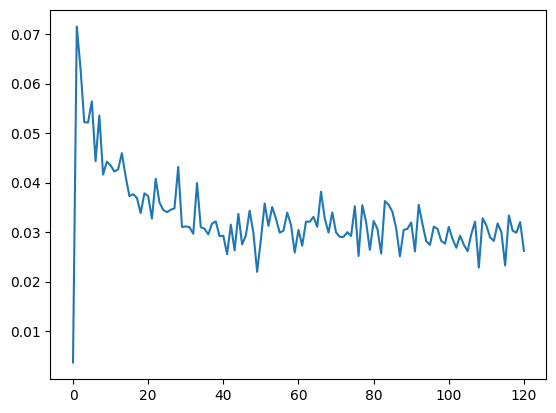

In [87]:
plt.plot(np.array(loss_list))

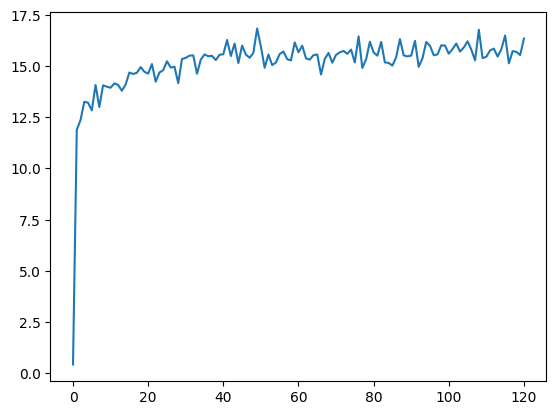

In [88]:
plt.plot(np.array(psnr_list))

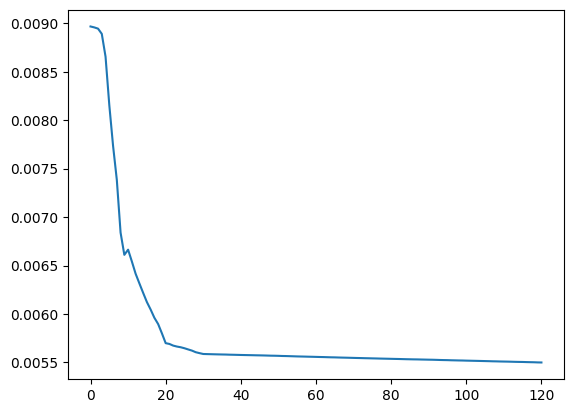

In [89]:
plt.plot(np.array(mse_euler_error_list))

In [ ]:

test_pose_w_R_c = test_pose[:3,:3]
test_pose_w_T_c = test_pose[:3, 3]
lr_rotation=0.1

In [ ]:








r = Rotation.from_matrix(test_pose_w_R_c.cpu())
euler_angles_orig = torch.Tensor(r.as_euler('xyz', degrees = False))
noise = torch.randn_like(euler_angles_orig)
euler_angles = euler_angles_orig + 0.1 * noise

In [ ]:
import copy

In [ ]:

mse_list = []
running_mse = 0
for test_itr in range(1500):
    test_input = copy.deepcopy(euler_angles).to(device)
    test_input.requires_grad_()
    
    x = test_input[0].reshape(1).requires_grad_()
    y = test_input[1].reshape(1).requires_grad_()
    z = test_input[2].reshape(1).requires_grad_()
    
    tensor_0 = torch.zeros(1).to(device)
    tensor_1 = torch.ones(1).to(device)
    
    Rx = torch.stack([
                torch.stack([tensor_1, tensor_0, tensor_0]),
                torch.stack([tensor_0, torch.cos(x), -torch.sin(x)]),
                torch.stack([tensor_0, torch.sin(x), torch.cos(x)])]).reshape(3,3)
    Ry = torch.stack([
                torch.stack([torch.cos(y), tensor_0, torch.sin(y)]),
                torch.stack([tensor_0, tensor_1, tensor_0]),
                torch.stack([-torch.sin(y), tensor_0, torch.cos(y)])]).reshape(3,3)
    Rz = torch.stack([
                torch.stack([torch.cos(z), -torch.sin(z), tensor_0]),
                torch.stack([torch.sin(z), torch.cos(z), tensor_0]),
                torch.stack([tensor_0, tensor_0, tensor_1])]).reshape(3,3)
    Rx.retain_grad()
    Ry.retain_grad()
    Rz.retain_grad()
    w_R_c = Rz @ Ry @ Rx
    w_R_c = w_R_c.to(device)
    
    optimizer.zero_grad()
    rec_image = one_forward_pass(height, width, intrinsics, w_R_c, test_pose_w_T_c.to(device), near, far, samples, model, num_x_frequencies, num_d_frequencies)
    
    loss = criterion(rec_image, test_image)
    loss.backward()
    euler_angles = euler_angles - lr_rotation * test_input.grad.detach().to('cpu')
    mse = criterion(euler_angles.to('cpu'),euler_angles_orig.to('cpu')).detach().item()
    running_mse += mse
    if test_itr%25==0 and test_itr!=0:
        print('Test image MSE is:', running_mse/25)
        mse_list.append(running_mse/25)
        running_mse = 0
    if test_itr==0:
        print('Test image MSE is:', mse)
    if test_itr%150==0 and test_itr>0 and test_itr<601:
            lr_rotation *= 0.01

In [ ]:
plt.plot(mse_list)

In [ ]:
np.save('testpose_perturb_euler_grad_mse_euler_list_v1.npy', np.array(mse_list))

In [90]:
r =  Rotation.from_euler('xyz', euler_angles_all, degrees=False)
w_R_c_all_perturb = torch.from_numpy(r.as_matrix()).float().to(device)



w_R_c_all_perturb[0].shape, w_R_c_all_perturb[0]

(torch.Size([3, 3]),
 tensor([[-0.9960,  0.0287, -0.0849],
         [ 0.0891,  0.2180, -0.9719],
         [-0.0094, -0.9755, -0.2197]], device='cuda:0'))

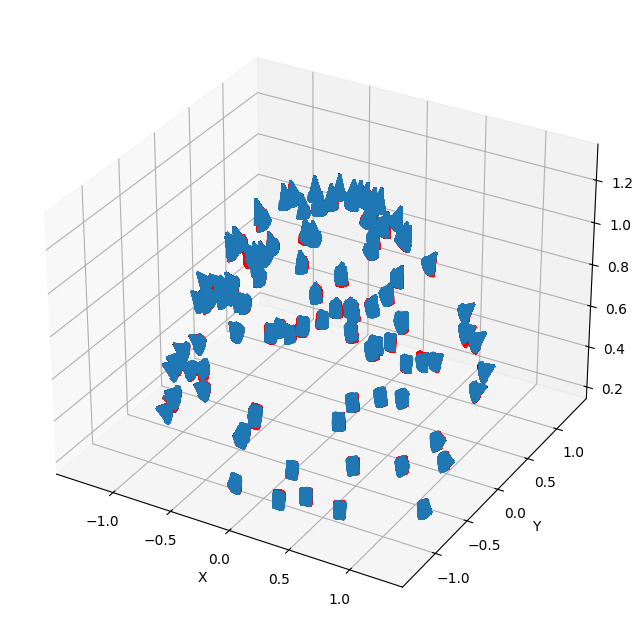

In [91]:
def plot_all_poses(poses, w_R_c_all_perturb, w_T_c_all):


    poses = torch.Tensor(poses).to(device)
    
    w_R_c = poses[:,:3,:3]
    w_T_c = poses[:,:3,3]
    origins = torch.zeros((poses.shape[0],height, width, 3))
    directions = torch.zeros((poses.shape[0],height, width, 3))
    for i in range(poses.shape[0]):
      ray_o, ray_d = get_rays(height, width, intrinsics, w_R_c[i,...].reshape((3,3)), w_T_c[i,...].reshape((3,1)))
      origins[i] = ray_o.to('cpu')
      directions[i] = ray_d.to('cpu')
      
      
    


    ax = plt.figure(figsize=(12, 8)).add_subplot(projection='3d')
    _ = ax.quiver(origins[..., 0].flatten(),
                  origins[..., 1].flatten(),
                  origins[..., 2].flatten(),
                  directions[..., 0].flatten(),
                  directions[..., 1].flatten(),
                  directions[..., 2].flatten(), length=0.12, normalize=True, color='red')
    
    w_R_c = w_R_c_all_perturb
    w_T_c = w_T_c_all
    origins = torch.zeros((poses.shape[0],height, width, 3))
    directions = torch.zeros((poses.shape[0],height, width, 3))
    for i in range(poses.shape[0]):
      ray_o, ray_d = get_rays(height, width, intrinsics, w_R_c[i,...].reshape((3,3)), w_T_c[i,...].reshape((3,1)))
      origins[i] = ray_o.to('cpu')
      directions[i] = ray_d.to('cpu')
      
      
    


    _ = ax.quiver(origins[..., 0].flatten(),
                  origins[..., 1].flatten(),
                  origins[..., 2].flatten(),
                  directions[..., 0].flatten(),
                  directions[..., 1].flatten(),
                  directions[..., 2].flatten(), length=0.12, normalize=True)
  
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('z')
    plt.show()

plot_all_poses(data['poses'], w_R_c_all_perturb, w_T_c_all)